In [202]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('..')
import model.model_cnnvae_conditional

# import Tensorflow before Pytorch Lightning
import tensorflow as tf
import torchvision
import torch
import lightning.pytorch as pl

from sklearn.decomposition import PCA
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from tqdm import tqdm
import pandas as pd
import os
import time
from enum import Enum
import pdb
import math
sys.path.append('../../PUPS/') # This external repository is available at https://github.com/uhlerlab/PUPS
from src.dataset.dataset import SubCellDatset, DatasetType, CLASSES
from PIL import Image

import sklearn
import sklearn.ensemble
import sklearn.neighbors
import seaborn as sns
import umap

from src.utils.data_handling_utils import initialize_datasets, Retrieval_Data

fig = plt.figure()
import pickle

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<Figure size 640x480 with 0 Axes>

In [2]:
testCellLine='U2OS'
from pymongo import MongoClient
COLLECTION_NAME = "splice_isoform_dataset_cell_line_and_gene_split_full"
cell_line_grouping = None
with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa_old[COLLECTION_NAME]
    cell_line_grouping = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$cell_line", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )
for clidx in cell_line_grouping:
    if clidx['_id'] == testCellLine:
        cellIDbyCellLine=np.array(clidx['ids'])

In [3]:
COLLECTION_NAME = "random_splice_isoform_dataset"
cell_line_grouping_new = None
with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa[COLLECTION_NAME]
    cell_line_grouping_new = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$cell_line", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )
for clidx in cell_line_grouping_new:
    if clidx['_id'] == testCellLine:
        cellIDbyCellLine_new=np.array(clidx['ids'])

In [4]:
cellIDbyCellLine_new

array(['train_3', 'train_4', 'train_6', ..., 'train_27529', 'train_27531',
       'train_27536'], dtype='<U11')

In [5]:
cellIDbyCellLine.shape

(138682,)

In [6]:
cellIDbyCellLine_new.shape

(10094,)

In [7]:
train_dataset, val_dataset, test_dataset, get_data = initialize_datasets("splice_isoform_dataset_cell_line_and_gene_split_full",if_alphabetical=True)
train_dataset_new, val_dataset_new, test_dataset_new, get_data_new = initialize_datasets("random_splice_isoform_dataset",if_alphabetical=False)


In [8]:
COLLECTION_NAME = "splice_isoform_dataset_cell_line_and_gene_split_full"

with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa_old[COLLECTION_NAME]
    isoform_grouping = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$splice_isoform_id", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )
    
cellIDbyCellLine_pNames=np.array([None]*cellIDbyCellLine.shape[0])
for pidx in range(len(isoform_grouping)):
    pcurr=isoform_grouping[pidx]['_id']
    pcurr=pcurr.split('-')[0]
    cellIDcurr=isoform_grouping[pidx]['ids']
    cellIDcurr,_,cellIdx=np.intersect1d(cellIDcurr,cellIDbyCellLine,return_indices=True)
    if cellIdx.size>0:
        cellIDbyCellLine_pNames[cellIdx]=pcurr

COLLECTION_NAME = "random_splice_isoform_dataset"

with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa[COLLECTION_NAME]
    isoform_grouping_new = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$splice_isoform_id", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )
    
cellIDbyCellLine_new_pNames=np.array([None]*cellIDbyCellLine_new.shape[0])
for pidx in range(len(isoform_grouping_new)):
    pcurr=isoform_grouping_new[pidx]['_id']
    pcurr=pcurr.split('-')[0]
    cellIDcurr=isoform_grouping_new[pidx]['ids']
    cellIDcurr,_,cellIdx=np.intersect1d(cellIDcurr,cellIDbyCellLine_new,return_indices=True)
    if cellIdx.size>0:
        cellIDbyCellLine_new_pNames[cellIdx]=pcurr

np.unique(cellIDbyCellLine_new_pNames).shape

(488,)

In [9]:
np.unique(cellIDbyCellLine_pNames).shape

(2578,)

(array([2.457e+03, 3.720e+02, 8.100e+01, 3.100e+01, 1.400e+01, 5.000e+00,
        3.000e+00, 3.000e+00, 3.000e+00, 2.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([   3. ,   75.7,  148.4,  221.1,  293.8,  366.5,  439.2,  511.9,
         584.6,  657.3,  730. ,  802.7,  875.4,  948.1, 1020.8, 1093.5,
        1166.2, 1238.9, 1311.6, 1384.3, 1457. , 1529.7, 1602.4, 1675.1,
        1747.8, 1820.5, 1893.2, 1965.9, 2038.6, 2111.3, 2184. ]),
 <BarContainer object of 30 artists>)

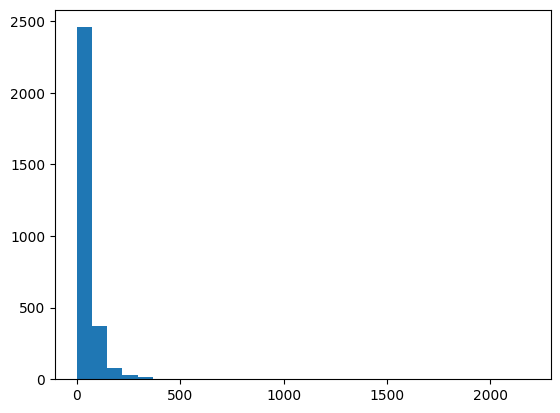

In [11]:
# cellIDbyCellLine_pNamesUnique,pcounts=np.unique(cellIDbyCellLine_pNames,return_counts=True)

cellIDbyCellLine_pNamesUniqueComb,pcounts=np.unique(np.concatenate((cellIDbyCellLine_pNames,cellIDbyCellLine_new_pNames)),return_counts=True)
plt.hist(pcounts,bins=30)

In [12]:
pcounts_min=150
cellIDbyCellLine_pNamesUniqueFiltered=cellIDbyCellLine_pNamesUniqueComb[pcounts>pcounts_min]
cellIDbyCellLine_pNames_filterIdx=np.repeat(False,cellIDbyCellLine_pNames.size)
for pcurr in cellIDbyCellLine_pNamesUniqueFiltered:
    cellIDbyCellLine_pNames_filterIdx[cellIDbyCellLine_pNames==pcurr]=True
cellIDbyCellLine_pNamesFiltered=cellIDbyCellLine_pNames[cellIDbyCellLine_pNames_filterIdx]
cellIDbyCellLine_Filtered=cellIDbyCellLine[cellIDbyCellLine_pNames_filterIdx]
cellIDbyCellLine_Filtered.shape

(36150,)

(array([2.457e+03, 3.720e+02, 8.100e+01, 3.100e+01, 1.400e+01, 5.000e+00,
        3.000e+00, 3.000e+00, 3.000e+00, 2.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([   3. ,   75.7,  148.4,  221.1,  293.8,  366.5,  439.2,  511.9,
         584.6,  657.3,  730. ,  802.7,  875.4,  948.1, 1020.8, 1093.5,
        1166.2, 1238.9, 1311.6, 1384.3, 1457. , 1529.7, 1602.4, 1675.1,
        1747.8, 1820.5, 1893.2, 1965.9, 2038.6, 2111.3, 2184. ]),
 <BarContainer object of 30 artists>)

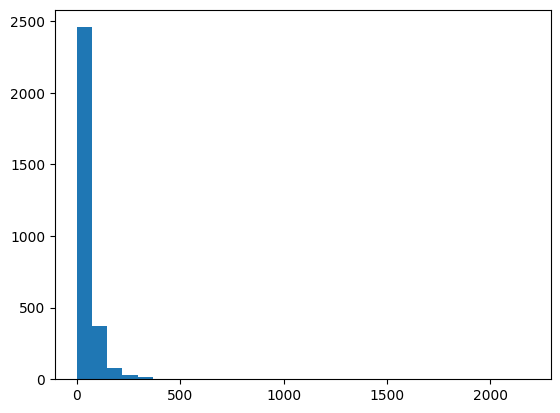

In [13]:
cellIDbyCellLine_new_pNamesUnique,pcounts_new=np.unique(cellIDbyCellLine_new_pNames,return_counts=True)
plt.hist(pcounts,bins=30)

In [14]:
# pcounts_min_new=100
# cellIDbyCellLine_new_pNamesUniqueFiltered=cellIDbyCellLine_new_pNamesUnique[pcounts_new>pcounts_min_new]
cellIDbyCellLine_pNames_new_filterIdx=np.repeat(False,cellIDbyCellLine_new_pNames.size)
for pcurr in cellIDbyCellLine_pNamesUniqueFiltered:
    cellIDbyCellLine_pNames_new_filterIdx[cellIDbyCellLine_new_pNames==pcurr]=True
cellIDbyCellLine_new_pNamesFiltered=cellIDbyCellLine_new_pNames[cellIDbyCellLine_pNames_new_filterIdx]
cellIDbyCellLine_new_Filtered=cellIDbyCellLine_new[cellIDbyCellLine_pNames_new_filterIdx]
cellIDbyCellLine_new_Filtered.shape

(1524,)

In [62]:
#get images
nsamples_all=cellIDbyCellLine_Filtered.size+cellIDbyCellLine_new_Filtered.size
allImages=np.zeros((nsamples_all,3,128,128))
allPnames=np.concatenate((cellIDbyCellLine_pNamesFiltered,cellIDbyCellLine_new_pNamesFiltered))
for i in range(cellIDbyCellLine_Filtered.size):
    if i%500==0:
        print(i)
    allImages[i]=get_data(cellIDbyCellLine_Filtered[i],Retrieval_Data.CELL_IMAGE)
for i in range(cellIDbyCellLine_new_Filtered.size):
    allImages[i+cellIDbyCellLine_Filtered.size]=get_data_new(cellIDbyCellLine_new_Filtered[i],Retrieval_Data.CELL_IMAGE)
    

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500
15000
15500
16000
16500
17000
17500
18000
18500
19000
19500
20000
20500
21000
21500
22000
22500
23000
23500
24000
24500
25000
25500
26000
26500
27000
27500
28000
28500
29000
29500
30000
30500
31000
31500
32000
32500
33000
33500
34000
34500
35000
35500
36000


In [63]:
#get protein images
allProteinImages=np.zeros((nsamples_all,128,128))
for i in range(cellIDbyCellLine_Filtered.size):
    if i%500==0:
        print(i)
    allProteinImages[i]=get_data(cellIDbyCellLine_Filtered[i],Retrieval_Data.TRUE_LABELS)[1]
for i in range(cellIDbyCellLine_new_Filtered.size):
    allProteinImages[i+cellIDbyCellLine_Filtered.size]=get_data_new(cellIDbyCellLine_new_Filtered[i],Retrieval_Data.TRUE_LABELS)[1]
    

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500
15000
15500
16000
16500
17000
17500
18000
18500
19000
19500
20000
20500
21000
21500
22000
22500
23000
23500
24000
24500
25000
25500
26000
26500
27000
27500
28000
28500
29000
29500
30000
30500
31000
31500
32000
32500
33000
33500
34000
34500
35000
35500
36000


### train

In [20]:
sharedSizes=[512]
dSpecific_filter=[(100,16)]
pID_type='randInit'
seed=3
c=1
p=2

In [21]:
#train-test split
np.random.seed(3)
pctVal=0.05
pctTest=0.1

allIdx_all=np.arange(nsamples_all)
np.random.shuffle(allIdx_all)
valIdx_all=allIdx_all[:int(pctVal*nsamples_all)]
testIdx_all=allIdx_all[int(pctVal*nsamples_all):(int(pctVal*nsamples_all)+int(pctTest*nsamples_all))]
trainIdx_all=allIdx_all[(int(pctVal*nsamples_all)+int(pctTest*nsamples_all)):]



In [22]:
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

#VAE settings
epochs=4250
saveFreq=850
lr_latent=0.001 #initial learning rate
lr_decoder=0.0001
weight_decay=0 #Weight for L2 loss on embedding matrix.

# batchsize=4
batchsize=256
kernel_size=4
stride=2
padding=1

hidden1=64 
hidden2=128 
hidden3=256
hidden4=256
hidden5=96
hidden5_xy=4
fc_dim1=96*hidden5_xy*hidden5_xy

dropout=0.01




In [23]:
printFreq=1
trainIdx=trainIdx_all
imgsC_all=allImages[:,[c]]
imgsP_all=allImages[:,[p]]
def train(epoch):
    t = time.time()
    modelcnn_dna.train()
    modelcnn_protein.train()

    loss_x_train_all_dna=0
    loss_x_train_all_protein=0
    loss_lNorm_all=0
    loss_lNorm_all_dna=0
    loss_lNorm_all_protein=0
    loss_all=0
    ntrainBatches=int(np.ceil(trainIdx.shape[0]/batchsize))
    for i in range(ntrainBatches):
#         if i%200==0:
#         print(i)
        trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
        traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
        traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
        trainIdx_i=torch.tensor(trainIdx_i)
        trainInput_shared=latent_shared(trainIdx_i).cuda().float()
        trainInput_dna=latent_dna(trainIdx_i).cuda().float()
        trainInput_protein=latent_protein(trainIdx_i).cuda().float()
        if addNoise:
            trainInput_shared=trainInput_shared+torch.randn_like(trainInput_shared)
            trainInput_dna=trainInput_dna+torch.randn_like(trainInput_dna)
            trainInput_protein=trainInput_protein+torch.randn_like(trainInput_protein)
#         print(trainInput.shape)

        optimizer_dna.zero_grad()
        optimizer_protein.zero_grad()
        optimizer_latent.zero_grad()

        recon_dna= modelcnn_dna(torch.cat((trainInput_shared,trainInput_dna),dim=1))
        recon_protein= modelcnn_protein(torch.cat((trainInput_shared,trainInput_protein),dim=1))
        
        loss_x_train_protein=loss_x(recon_protein, traintarget_protein)
        loss_x_train_dna=loss_x(recon_dna, traintarget_dna)
        
        loss=loss_x_train_protein+loss_x_train_dna
        if addNoise:
            loss_lNorm=torch.mean(torch.linalg.norm(latent_shared(trainIdx_i).cuda(),dim=1))/latent_shared.embedding_dim
            loss_lNorm_all+=loss_lNorm.item()
            loss+=loss_lNorm*actDecay
            
            loss_lNorm_dna=torch.mean(torch.linalg.norm(latent_dna(trainIdx_i).cuda(),dim=1))/latent_dna.embedding_dim
            loss_lNorm_all_dna+=loss_lNorm_dna.item()
            loss+=loss_lNorm_dna*actDecay
            
            loss_lNorm_protein=torch.mean(torch.linalg.norm(latent_protein(trainIdx_i).cuda(),dim=1))/latent_protein.embedding_dim
            loss_lNorm_all_protein+=loss_lNorm_protein.item()
            loss+=loss_lNorm_protein*actDecay
        
        loss_x_train_all_dna+=loss_x_train_dna.item()
        loss_x_train_all_protein+=loss_x_train_protein.item()
        loss_all+=loss.item()
        
        loss.backward()
        optimizer_dna.step()
        optimizer_protein.step()
        optimizer_latent.step()


    loss_x_train_all_dna=loss_x_train_all_dna/ntrainBatches
    loss_x_train_all_protein=loss_x_train_all_protein/ntrainBatches
    loss_all=loss_all/ntrainBatches
    if addNoise:
        loss_lNorm_all=loss_lNorm_all/ntrainBatches
        loss_lNorm_all_dna=loss_lNorm_all_dna/ntrainBatches
        loss_lNorm_all_protein=loss_lNorm_all_protein/ntrainBatches




    if epoch%printFreq==0:
        print('Epoch: {:04d}'.format(epoch),
              'loss_train: {:.4f}'.format(loss_all),
              'loss_x_train_dna: {:.4f}'.format(loss_x_train_all_dna),
              'loss_x_train_protein: {:.4f}'.format(loss_x_train_all_protein),
              'time: {:.4f}s'.format(time.time() - t))
    return loss_all,loss_x_train_all_dna,loss_x_train_all_protein,loss_lNorm_all,loss_lNorm_all_dna,loss_lNorm_all_protein

In [24]:
match_weight=1
sharedWeight=1
addNoise=True
actDecay=0.001
name_train='microtubule_er_noSharedRecon_all'
modelname_train='hpa_lord'
logsavepath_train=os.path.join('/mnt/d2/xinyi/c2p/hpa/log/',modelname_train,name_train)
modelsavepath_train=os.path.join('/mnt/d2/xinyi/c2p/hpa/models/',modelname_train,name_train)
plotsavepath_train=os.path.join('/mnt/d2/xinyi/c2p/hpa/plots/',modelname_train,name_train)

if not os.path.exists(os.path.join('/mnt/d2/xinyi/c2p/hpa/log/',modelname_train)):
    os.mkdir(os.path.join('/mnt/d2/xinyi/c2p/hpa/log/',modelname_train))
    os.mkdir(os.path.join('/mnt/d2/xinyi/c2p/hpa/models/',modelname_train))
    os.mkdir(os.path.join('/mnt/d2/xinyi/c2p/hpa/plots/',modelname_train))
if not os.path.exists(logsavepath_train):
    os.mkdir(logsavepath_train)
    os.mkdir(os.path.join(logsavepath_train,'dna'))
    os.mkdir(os.path.join(logsavepath_train,'protein'))
if not os.path.exists(modelsavepath_train):
    os.mkdir(modelsavepath_train)
    os.mkdir(os.path.join(modelsavepath_train,'dna'))
    os.mkdir(os.path.join(modelsavepath_train,'protein'))
if not os.path.exists(plotsavepath_train):
    os.mkdir(plotsavepath_train)
    os.mkdir(os.path.join(plotsavepath_train,'dna'))
    os.mkdir(os.path.join(plotsavepath_train,'protein'))




In [25]:

logsavepath_p_dna=os.path.join(logsavepath_train,'dna')
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
plotsavepath_p_dna=os.path.join(plotsavepath_train,'dna')
if not os.path.exists(logsavepath_p_dna):
    os.mkdir(logsavepath_p_dna)
if not os.path.exists(modelsavepath_p_dna):
    os.mkdir(modelsavepath_p_dna)
if not os.path.exists(plotsavepath_p_dna):
    os.mkdir(plotsavepath_p_dna)

logsavepath_p_protein=os.path.join(logsavepath_train,'protein')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
plotsavepath_p_protein=os.path.join(plotsavepath_train,'protein')
if not os.path.exists(logsavepath_p_protein):
    os.mkdir(logsavepath_p_protein)
if not os.path.exists(modelsavepath_p_protein):
    os.mkdir(modelsavepath_p_protein)
if not os.path.exists(plotsavepath_p_protein):
    os.mkdir(plotsavepath_p_protein)



for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared

        loss_x=torch.nn.BCEWithLogitsLoss()

        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='hpa_lord':
            modelcnn_dna = model.model_cnnvae_conditional.CNN_VAE_decode(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,applySigmoid=False)
            modelcnn_protein = model.model_cnnvae_conditional.CNN_VAE_decode(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,applySigmoid=False)
        modelcnn_dna.cuda()
        modelcnn_protein.cuda()

        optimizer_dna = torch.optim.Adam(modelcnn_dna.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_protein = torch.optim.Adam(modelcnn_protein.parameters(), lr=lr_decoder, weight_decay=weight_decay)

        train_loss=[np.inf]*(epochs)
        train_loss_x_dna=[np.inf]*(epochs)
        train_loss_x_protein=[np.inf]*(epochs)
        
        train_lNorm=[np.inf]*(epochs)
        train_lNorm_dna=[np.inf]*(epochs)
        train_lNorm_protein=[np.inf]*(epochs)

        t_ep=time.time()

        stateDict_train_dna={}
        stateDict_train_protein={}
        
        latent_shared=torch.nn.Embedding(nsamples_all,currLatentSize)
        latent_protein=torch.nn.Embedding(nsamples_all,dSpecificSize)
        latent_dna=torch.nn.Embedding(nsamples_all,dSpecificSize)
        optimizer_latent= torch.optim.Adam([latent_shared.weight,latent_protein.weight,latent_dna.weight], lr=lr_latent, weight_decay=weight_decay)


        for ep in range(850,epochs):
            train_loss[ep],train_loss_x_dna[ep],train_loss_x_protein[ep],train_lNorm[ep],train_lNorm_dna[ep],train_lNorm_protein[ep]=train(ep)


            if ep%saveFreq == (saveFreq-1):
                stateDict_train_dna[ep]=modelcnn_dna.cpu().state_dict()
                stateDict_train_protein[ep]=modelcnn_protein.cpu().state_dict()
                with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_dna.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_shared.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_protein.weight, output, pickle.HIGHEST_PROTOCOL)


            modelcnn_dna.cuda()
            modelcnn_protein.cuda()
            torch.cuda.empty_cache()
        print(' total time: {:.4f}s'.format(time.time() - t_ep))

        with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(stateDict_train_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(stateDict_train_protein, output, pickle.HIGHEST_PROTOCOL)

        with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_loss_x_dna, output, pickle.HIGHEST_PROTOCOL)


        with open(os.path.join(logsavepath_p_protein,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_loss_x_protein, output, pickle.HIGHEST_PROTOCOL)

        with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_lNormDNA_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_lNorm_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_protein,'train_lNormProtein_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
            pickle.dump(train_lNorm_protein, output, pickle.HIGHEST_PROTOCOL)


        plt.plot(np.arange(epochs),train_loss_x_dna)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
        plt.show()


        plt.plot(np.arange(epochs),train_loss_x_protein)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
        plt.show()



512
100
Epoch: 0850 loss_train: 0.9901 loss_x_train_dna: 0.5990 loss_x_train_protein: 0.3909 time: 18.3467s
Epoch: 0851 loss_train: 0.7796 loss_x_train_dna: 0.4265 loss_x_train_protein: 0.3529 time: 17.3194s
Epoch: 0852 loss_train: 0.7584 loss_x_train_dna: 0.4061 loss_x_train_protein: 0.3520 time: 17.4310s
Epoch: 0853 loss_train: 0.7528 loss_x_train_dna: 0.4019 loss_x_train_protein: 0.3507 time: 17.1204s
Epoch: 0854 loss_train: 0.7488 loss_x_train_dna: 0.4000 loss_x_train_protein: 0.3485 time: 17.5850s
Epoch: 0855 loss_train: 0.7441 loss_x_train_dna: 0.3977 loss_x_train_protein: 0.3462 time: 16.9223s
Epoch: 0856 loss_train: 0.7389 loss_x_train_dna: 0.3949 loss_x_train_protein: 0.3437 time: 17.1402s
Epoch: 0857 loss_train: 0.7336 loss_x_train_dna: 0.3923 loss_x_train_protein: 0.3411 time: 17.3916s
Epoch: 0858 loss_train: 0.7283 loss_x_train_dna: 0.3895 loss_x_train_protein: 0.3386 time: 16.8747s
Epoch: 0859 loss_train: 0.7241 loss_x_train_dna: 0.3873 loss_x_train_protein: 0.3366 time: 1

Epoch: 0932 loss_train: 0.6018 loss_x_train_dna: 0.3286 loss_x_train_protein: 0.2729 time: 16.7930s
Epoch: 0933 loss_train: 0.6010 loss_x_train_dna: 0.3283 loss_x_train_protein: 0.2725 time: 17.5945s
Epoch: 0934 loss_train: 0.6002 loss_x_train_dna: 0.3279 loss_x_train_protein: 0.2720 time: 17.5742s
Epoch: 0935 loss_train: 0.5993 loss_x_train_dna: 0.3273 loss_x_train_protein: 0.2717 time: 17.2954s
Epoch: 0936 loss_train: 0.5984 loss_x_train_dna: 0.3270 loss_x_train_protein: 0.2712 time: 17.5638s
Epoch: 0937 loss_train: 0.5978 loss_x_train_dna: 0.3267 loss_x_train_protein: 0.2709 time: 17.5060s
Epoch: 0938 loss_train: 0.5969 loss_x_train_dna: 0.3262 loss_x_train_protein: 0.2705 time: 17.2912s
Epoch: 0939 loss_train: 0.5962 loss_x_train_dna: 0.3259 loss_x_train_protein: 0.2701 time: 17.3388s
Epoch: 0940 loss_train: 0.5953 loss_x_train_dna: 0.3254 loss_x_train_protein: 0.2696 time: 17.5294s
Epoch: 0941 loss_train: 0.5946 loss_x_train_dna: 0.3251 loss_x_train_protein: 0.2693 time: 16.8195s


Epoch: 1014 loss_train: 0.5502 loss_x_train_dna: 0.3018 loss_x_train_protein: 0.2481 time: 17.5552s
Epoch: 1015 loss_train: 0.5496 loss_x_train_dna: 0.3015 loss_x_train_protein: 0.2478 time: 17.1960s
Epoch: 1016 loss_train: 0.5492 loss_x_train_dna: 0.3014 loss_x_train_protein: 0.2476 time: 16.9437s
Epoch: 1017 loss_train: 0.5486 loss_x_train_dna: 0.3010 loss_x_train_protein: 0.2473 time: 17.2768s
Epoch: 1018 loss_train: 0.5481 loss_x_train_dna: 0.3008 loss_x_train_protein: 0.2471 time: 17.4685s
Epoch: 1019 loss_train: 0.5476 loss_x_train_dna: 0.3005 loss_x_train_protein: 0.2468 time: 17.4000s
Epoch: 1020 loss_train: 0.5471 loss_x_train_dna: 0.3002 loss_x_train_protein: 0.2466 time: 17.5415s
Epoch: 1021 loss_train: 0.5465 loss_x_train_dna: 0.2999 loss_x_train_protein: 0.2463 time: 17.5140s
Epoch: 1022 loss_train: 0.5460 loss_x_train_dna: 0.2996 loss_x_train_protein: 0.2461 time: 17.5850s
Epoch: 1023 loss_train: 0.5455 loss_x_train_dna: 0.2994 loss_x_train_protein: 0.2459 time: 17.5605s


Epoch: 1096 loss_train: 0.5162 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.2326 time: 17.5459s
Epoch: 1097 loss_train: 0.5159 loss_x_train_dna: 0.2832 loss_x_train_protein: 0.2324 time: 17.8080s
Epoch: 1098 loss_train: 0.5156 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.2323 time: 17.8910s
Epoch: 1099 loss_train: 0.5153 loss_x_train_dna: 0.2828 loss_x_train_protein: 0.2321 time: 17.3756s
Epoch: 1100 loss_train: 0.5149 loss_x_train_dna: 0.2826 loss_x_train_protein: 0.2320 time: 17.6949s
Epoch: 1101 loss_train: 0.5145 loss_x_train_dna: 0.2824 loss_x_train_protein: 0.2318 time: 17.9710s
Epoch: 1102 loss_train: 0.5142 loss_x_train_dna: 0.2823 loss_x_train_protein: 0.2316 time: 17.7967s
Epoch: 1103 loss_train: 0.5139 loss_x_train_dna: 0.2821 loss_x_train_protein: 0.2315 time: 17.9448s
Epoch: 1104 loss_train: 0.5136 loss_x_train_dna: 0.2820 loss_x_train_protein: 0.2313 time: 17.6020s
Epoch: 1105 loss_train: 0.5135 loss_x_train_dna: 0.2820 loss_x_train_protein: 0.2312 time: 17.2659s


Epoch: 1178 loss_train: 0.4965 loss_x_train_dna: 0.2728 loss_x_train_protein: 0.2234 time: 17.8901s
Epoch: 1179 loss_train: 0.4962 loss_x_train_dna: 0.2725 loss_x_train_protein: 0.2233 time: 17.9427s
Epoch: 1180 loss_train: 0.4959 loss_x_train_dna: 0.2724 loss_x_train_protein: 0.2232 time: 17.0316s
Epoch: 1181 loss_train: 0.4957 loss_x_train_dna: 0.2722 loss_x_train_protein: 0.2231 time: 17.5989s
Epoch: 1182 loss_train: 0.4954 loss_x_train_dna: 0.2720 loss_x_train_protein: 0.2230 time: 18.1524s
Epoch: 1183 loss_train: 0.4952 loss_x_train_dna: 0.2720 loss_x_train_protein: 0.2229 time: 17.9871s
Epoch: 1184 loss_train: 0.4950 loss_x_train_dna: 0.2718 loss_x_train_protein: 0.2228 time: 17.1732s
Epoch: 1185 loss_train: 0.4948 loss_x_train_dna: 0.2717 loss_x_train_protein: 0.2228 time: 17.6632s
Epoch: 1186 loss_train: 0.4946 loss_x_train_dna: 0.2716 loss_x_train_protein: 0.2227 time: 18.0301s
Epoch: 1187 loss_train: 0.4944 loss_x_train_dna: 0.2714 loss_x_train_protein: 0.2226 time: 17.9641s


Epoch: 1266 loss_train: 0.4842 loss_x_train_dna: 0.2655 loss_x_train_protein: 0.2184 time: 16.9621s
Epoch: 1267 loss_train: 0.4841 loss_x_train_dna: 0.2654 loss_x_train_protein: 0.2183 time: 16.8773s
Epoch: 1268 loss_train: 0.4841 loss_x_train_dna: 0.2655 loss_x_train_protein: 0.2182 time: 17.4274s
Epoch: 1269 loss_train: 0.4838 loss_x_train_dna: 0.2654 loss_x_train_protein: 0.2181 time: 17.9349s
Epoch: 1270 loss_train: 0.4838 loss_x_train_dna: 0.2653 loss_x_train_protein: 0.2181 time: 18.1651s
Epoch: 1271 loss_train: 0.4837 loss_x_train_dna: 0.2653 loss_x_train_protein: 0.2180 time: 18.6114s
Epoch: 1272 loss_train: 0.4836 loss_x_train_dna: 0.2653 loss_x_train_protein: 0.2179 time: 18.0410s
Epoch: 1273 loss_train: 0.4834 loss_x_train_dna: 0.2653 loss_x_train_protein: 0.2178 time: 17.4377s
Epoch: 1274 loss_train: 0.4833 loss_x_train_dna: 0.2653 loss_x_train_protein: 0.2177 time: 18.1671s
Epoch: 1275 loss_train: 0.4836 loss_x_train_dna: 0.2656 loss_x_train_protein: 0.2176 time: 18.0679s


Epoch: 1348 loss_train: 0.4759 loss_x_train_dna: 0.2615 loss_x_train_protein: 0.2141 time: 17.1750s
Epoch: 1349 loss_train: 0.4759 loss_x_train_dna: 0.2614 loss_x_train_protein: 0.2140 time: 16.9011s
Epoch: 1350 loss_train: 0.4759 loss_x_train_dna: 0.2614 loss_x_train_protein: 0.2141 time: 17.1906s
Epoch: 1351 loss_train: 0.4758 loss_x_train_dna: 0.2613 loss_x_train_protein: 0.2141 time: 17.8617s
Epoch: 1352 loss_train: 0.4758 loss_x_train_dna: 0.2613 loss_x_train_protein: 0.2141 time: 18.2842s
Epoch: 1353 loss_train: 0.4756 loss_x_train_dna: 0.2612 loss_x_train_protein: 0.2141 time: 17.6716s
Epoch: 1354 loss_train: 0.4756 loss_x_train_dna: 0.2612 loss_x_train_protein: 0.2140 time: 17.5672s
Epoch: 1355 loss_train: 0.4760 loss_x_train_dna: 0.2612 loss_x_train_protein: 0.2144 time: 18.2213s
Epoch: 1356 loss_train: 0.4760 loss_x_train_dna: 0.2611 loss_x_train_protein: 0.2145 time: 17.8972s
Epoch: 1357 loss_train: 0.4757 loss_x_train_dna: 0.2611 loss_x_train_protein: 0.2142 time: 17.8341s


Epoch: 1430 loss_train: 0.4705 loss_x_train_dna: 0.2587 loss_x_train_protein: 0.2114 time: 16.6315s
Epoch: 1431 loss_train: 0.4705 loss_x_train_dna: 0.2587 loss_x_train_protein: 0.2114 time: 16.6112s
Epoch: 1432 loss_train: 0.4704 loss_x_train_dna: 0.2586 loss_x_train_protein: 0.2114 time: 16.9913s
Epoch: 1433 loss_train: 0.4705 loss_x_train_dna: 0.2587 loss_x_train_protein: 0.2114 time: 16.9661s
Epoch: 1434 loss_train: 0.4705 loss_x_train_dna: 0.2587 loss_x_train_protein: 0.2114 time: 17.3794s
Epoch: 1435 loss_train: 0.4706 loss_x_train_dna: 0.2588 loss_x_train_protein: 0.2114 time: 16.9596s
Epoch: 1436 loss_train: 0.4706 loss_x_train_dna: 0.2588 loss_x_train_protein: 0.2114 time: 18.0797s
Epoch: 1437 loss_train: 0.4705 loss_x_train_dna: 0.2587 loss_x_train_protein: 0.2114 time: 18.0997s
Epoch: 1438 loss_train: 0.4704 loss_x_train_dna: 0.2586 loss_x_train_protein: 0.2114 time: 17.3626s
Epoch: 1439 loss_train: 0.4705 loss_x_train_dna: 0.2586 loss_x_train_protein: 0.2114 time: 17.7933s


Epoch: 1512 loss_train: 0.4664 loss_x_train_dna: 0.2565 loss_x_train_protein: 0.2095 time: 17.5655s
Epoch: 1513 loss_train: 0.4664 loss_x_train_dna: 0.2565 loss_x_train_protein: 0.2095 time: 17.3648s
Epoch: 1514 loss_train: 0.4664 loss_x_train_dna: 0.2565 loss_x_train_protein: 0.2095 time: 16.8781s
Epoch: 1515 loss_train: 0.4664 loss_x_train_dna: 0.2565 loss_x_train_protein: 0.2095 time: 17.9490s
Epoch: 1516 loss_train: 0.4664 loss_x_train_dna: 0.2565 loss_x_train_protein: 0.2095 time: 18.0301s
Epoch: 1517 loss_train: 0.4663 loss_x_train_dna: 0.2565 loss_x_train_protein: 0.2094 time: 17.6257s
Epoch: 1518 loss_train: 0.4664 loss_x_train_dna: 0.2565 loss_x_train_protein: 0.2094 time: 16.5299s
Epoch: 1519 loss_train: 0.4664 loss_x_train_dna: 0.2565 loss_x_train_protein: 0.2095 time: 16.9883s
Epoch: 1520 loss_train: 0.4663 loss_x_train_dna: 0.2564 loss_x_train_protein: 0.2095 time: 17.3016s
Epoch: 1521 loss_train: 0.4663 loss_x_train_dna: 0.2564 loss_x_train_protein: 0.2095 time: 17.2772s


Epoch: 1594 loss_train: 0.4639 loss_x_train_dna: 0.2552 loss_x_train_protein: 0.2083 time: 17.8595s
Epoch: 1595 loss_train: 0.4638 loss_x_train_dna: 0.2551 loss_x_train_protein: 0.2082 time: 17.8905s
Epoch: 1596 loss_train: 0.4637 loss_x_train_dna: 0.2551 loss_x_train_protein: 0.2082 time: 17.3073s
Epoch: 1597 loss_train: 0.4636 loss_x_train_dna: 0.2550 loss_x_train_protein: 0.2081 time: 17.8028s
Epoch: 1598 loss_train: 0.4635 loss_x_train_dna: 0.2549 loss_x_train_protein: 0.2081 time: 17.7028s
Epoch: 1599 loss_train: 0.4635 loss_x_train_dna: 0.2549 loss_x_train_protein: 0.2081 time: 18.3699s
Epoch: 1600 loss_train: 0.4634 loss_x_train_dna: 0.2549 loss_x_train_protein: 0.2080 time: 18.3658s
Epoch: 1601 loss_train: 0.4633 loss_x_train_dna: 0.2548 loss_x_train_protein: 0.2080 time: 17.7378s
Epoch: 1602 loss_train: 0.4633 loss_x_train_dna: 0.2548 loss_x_train_protein: 0.2080 time: 17.6771s
Epoch: 1603 loss_train: 0.4632 loss_x_train_dna: 0.2547 loss_x_train_protein: 0.2080 time: 17.8030s


Epoch: 1676 loss_train: 0.4611 loss_x_train_dna: 0.2536 loss_x_train_protein: 0.2070 time: 17.3186s
Epoch: 1677 loss_train: 0.4610 loss_x_train_dna: 0.2535 loss_x_train_protein: 0.2070 time: 18.2337s
Epoch: 1678 loss_train: 0.4609 loss_x_train_dna: 0.2535 loss_x_train_protein: 0.2070 time: 17.1669s
Epoch: 1679 loss_train: 0.4608 loss_x_train_dna: 0.2534 loss_x_train_protein: 0.2070 time: 17.9583s
Epoch: 1680 loss_train: 0.4608 loss_x_train_dna: 0.2534 loss_x_train_protein: 0.2070 time: 18.4193s
Epoch: 1681 loss_train: 0.4608 loss_x_train_dna: 0.2534 loss_x_train_protein: 0.2069 time: 17.8873s
Epoch: 1682 loss_train: 0.4608 loss_x_train_dna: 0.2534 loss_x_train_protein: 0.2069 time: 18.4266s
Epoch: 1683 loss_train: 0.4607 loss_x_train_dna: 0.2533 loss_x_train_protein: 0.2069 time: 18.0728s
Epoch: 1684 loss_train: 0.4607 loss_x_train_dna: 0.2533 loss_x_train_protein: 0.2069 time: 18.0438s
Epoch: 1685 loss_train: 0.4607 loss_x_train_dna: 0.2534 loss_x_train_protein: 0.2068 time: 17.9498s


Epoch: 1758 loss_train: 0.4599 loss_x_train_dna: 0.2524 loss_x_train_protein: 0.2070 time: 17.9711s
Epoch: 1759 loss_train: 0.4598 loss_x_train_dna: 0.2524 loss_x_train_protein: 0.2070 time: 17.7814s
Epoch: 1760 loss_train: 0.4596 loss_x_train_dna: 0.2523 loss_x_train_protein: 0.2068 time: 17.4325s
Epoch: 1761 loss_train: 0.4595 loss_x_train_dna: 0.2523 loss_x_train_protein: 0.2067 time: 18.1246s
Epoch: 1762 loss_train: 0.4594 loss_x_train_dna: 0.2523 loss_x_train_protein: 0.2066 time: 17.9303s
Epoch: 1763 loss_train: 0.4593 loss_x_train_dna: 0.2523 loss_x_train_protein: 0.2065 time: 17.3490s
Epoch: 1764 loss_train: 0.4592 loss_x_train_dna: 0.2522 loss_x_train_protein: 0.2064 time: 18.1235s
Epoch: 1765 loss_train: 0.4591 loss_x_train_dna: 0.2522 loss_x_train_protein: 0.2064 time: 17.7675s
Epoch: 1766 loss_train: 0.4590 loss_x_train_dna: 0.2522 loss_x_train_protein: 0.2063 time: 17.8872s
Epoch: 1767 loss_train: 0.4590 loss_x_train_dna: 0.2523 loss_x_train_protein: 0.2062 time: 17.6731s


Epoch: 1840 loss_train: 0.4572 loss_x_train_dna: 0.2514 loss_x_train_protein: 0.2053 time: 18.4679s
Epoch: 1841 loss_train: 0.4572 loss_x_train_dna: 0.2514 loss_x_train_protein: 0.2053 time: 17.5258s
Epoch: 1842 loss_train: 0.4572 loss_x_train_dna: 0.2514 loss_x_train_protein: 0.2053 time: 17.4928s
Epoch: 1843 loss_train: 0.4573 loss_x_train_dna: 0.2515 loss_x_train_protein: 0.2052 time: 18.2613s
Epoch: 1844 loss_train: 0.4573 loss_x_train_dna: 0.2515 loss_x_train_protein: 0.2052 time: 17.8202s
Epoch: 1845 loss_train: 0.4572 loss_x_train_dna: 0.2515 loss_x_train_protein: 0.2052 time: 17.6391s
Epoch: 1846 loss_train: 0.4571 loss_x_train_dna: 0.2514 loss_x_train_protein: 0.2052 time: 18.0994s
Epoch: 1847 loss_train: 0.4571 loss_x_train_dna: 0.2514 loss_x_train_protein: 0.2052 time: 17.7742s
Epoch: 1848 loss_train: 0.4570 loss_x_train_dna: 0.2513 loss_x_train_protein: 0.2052 time: 18.1331s
Epoch: 1849 loss_train: 0.4570 loss_x_train_dna: 0.2513 loss_x_train_protein: 0.2052 time: 18.1347s


Epoch: 1922 loss_train: 0.4561 loss_x_train_dna: 0.2506 loss_x_train_protein: 0.2050 time: 17.3458s
Epoch: 1923 loss_train: 0.4561 loss_x_train_dna: 0.2506 loss_x_train_protein: 0.2050 time: 17.2638s
Epoch: 1924 loss_train: 0.4560 loss_x_train_dna: 0.2506 loss_x_train_protein: 0.2049 time: 17.7285s
Epoch: 1925 loss_train: 0.4560 loss_x_train_dna: 0.2506 loss_x_train_protein: 0.2049 time: 17.5009s
Epoch: 1926 loss_train: 0.4559 loss_x_train_dna: 0.2505 loss_x_train_protein: 0.2049 time: 17.9691s
Epoch: 1927 loss_train: 0.4560 loss_x_train_dna: 0.2506 loss_x_train_protein: 0.2049 time: 17.6949s
Epoch: 1928 loss_train: 0.4561 loss_x_train_dna: 0.2507 loss_x_train_protein: 0.2049 time: 18.1782s
Epoch: 1929 loss_train: 0.4560 loss_x_train_dna: 0.2506 loss_x_train_protein: 0.2048 time: 17.9654s
Epoch: 1930 loss_train: 0.4560 loss_x_train_dna: 0.2506 loss_x_train_protein: 0.2049 time: 17.5525s
Epoch: 1931 loss_train: 0.4559 loss_x_train_dna: 0.2506 loss_x_train_protein: 0.2048 time: 18.1116s


Epoch: 2004 loss_train: 0.4544 loss_x_train_dna: 0.2499 loss_x_train_protein: 0.2040 time: 17.5177s
Epoch: 2005 loss_train: 0.4544 loss_x_train_dna: 0.2499 loss_x_train_protein: 0.2040 time: 18.1761s
Epoch: 2006 loss_train: 0.4544 loss_x_train_dna: 0.2499 loss_x_train_protein: 0.2040 time: 17.5872s
Epoch: 2007 loss_train: 0.4544 loss_x_train_dna: 0.2499 loss_x_train_protein: 0.2040 time: 17.6635s
Epoch: 2008 loss_train: 0.4544 loss_x_train_dna: 0.2499 loss_x_train_protein: 0.2040 time: 17.9836s
Epoch: 2009 loss_train: 0.4544 loss_x_train_dna: 0.2499 loss_x_train_protein: 0.2040 time: 18.0784s
Epoch: 2010 loss_train: 0.4543 loss_x_train_dna: 0.2498 loss_x_train_protein: 0.2040 time: 18.2406s
Epoch: 2011 loss_train: 0.4543 loss_x_train_dna: 0.2498 loss_x_train_protein: 0.2040 time: 17.5587s
Epoch: 2012 loss_train: 0.4543 loss_x_train_dna: 0.2497 loss_x_train_protein: 0.2040 time: 17.9812s
Epoch: 2013 loss_train: 0.4543 loss_x_train_dna: 0.2498 loss_x_train_protein: 0.2040 time: 17.4990s


Epoch: 2086 loss_train: 0.4536 loss_x_train_dna: 0.2492 loss_x_train_protein: 0.2039 time: 17.6524s
Epoch: 2087 loss_train: 0.4536 loss_x_train_dna: 0.2492 loss_x_train_protein: 0.2038 time: 17.6159s
Epoch: 2088 loss_train: 0.4536 loss_x_train_dna: 0.2492 loss_x_train_protein: 0.2038 time: 17.9663s
Epoch: 2089 loss_train: 0.4536 loss_x_train_dna: 0.2492 loss_x_train_protein: 0.2038 time: 17.8255s
Epoch: 2090 loss_train: 0.4536 loss_x_train_dna: 0.2492 loss_x_train_protein: 0.2038 time: 17.8788s
Epoch: 2091 loss_train: 0.4536 loss_x_train_dna: 0.2492 loss_x_train_protein: 0.2038 time: 17.5625s
Epoch: 2092 loss_train: 0.4536 loss_x_train_dna: 0.2492 loss_x_train_protein: 0.2038 time: 17.9780s
Epoch: 2093 loss_train: 0.4535 loss_x_train_dna: 0.2492 loss_x_train_protein: 0.2038 time: 17.6916s
Epoch: 2094 loss_train: 0.4534 loss_x_train_dna: 0.2491 loss_x_train_protein: 0.2037 time: 18.1015s
Epoch: 2095 loss_train: 0.4534 loss_x_train_dna: 0.2491 loss_x_train_protein: 0.2037 time: 18.4071s


Epoch: 2168 loss_train: 0.4523 loss_x_train_dna: 0.2487 loss_x_train_protein: 0.2030 time: 17.5628s
Epoch: 2169 loss_train: 0.4522 loss_x_train_dna: 0.2487 loss_x_train_protein: 0.2030 time: 17.7092s
Epoch: 2170 loss_train: 0.4522 loss_x_train_dna: 0.2486 loss_x_train_protein: 0.2030 time: 17.8517s
Epoch: 2171 loss_train: 0.4521 loss_x_train_dna: 0.2486 loss_x_train_protein: 0.2030 time: 18.0716s
Epoch: 2172 loss_train: 0.4521 loss_x_train_dna: 0.2486 loss_x_train_protein: 0.2030 time: 17.5922s
Epoch: 2173 loss_train: 0.4521 loss_x_train_dna: 0.2486 loss_x_train_protein: 0.2030 time: 17.6997s
Epoch: 2174 loss_train: 0.4521 loss_x_train_dna: 0.2486 loss_x_train_protein: 0.2030 time: 18.1391s
Epoch: 2175 loss_train: 0.4521 loss_x_train_dna: 0.2485 loss_x_train_protein: 0.2030 time: 17.8086s
Epoch: 2176 loss_train: 0.4521 loss_x_train_dna: 0.2485 loss_x_train_protein: 0.2030 time: 17.8231s
Epoch: 2177 loss_train: 0.4521 loss_x_train_dna: 0.2486 loss_x_train_protein: 0.2030 time: 18.4002s


Epoch: 2250 loss_train: 0.4516 loss_x_train_dna: 0.2484 loss_x_train_protein: 0.2026 time: 17.6969s
Epoch: 2251 loss_train: 0.4515 loss_x_train_dna: 0.2484 loss_x_train_protein: 0.2026 time: 18.0082s
Epoch: 2252 loss_train: 0.4515 loss_x_train_dna: 0.2484 loss_x_train_protein: 0.2026 time: 18.1862s
Epoch: 2253 loss_train: 0.4515 loss_x_train_dna: 0.2483 loss_x_train_protein: 0.2026 time: 18.1940s
Epoch: 2254 loss_train: 0.4514 loss_x_train_dna: 0.2483 loss_x_train_protein: 0.2026 time: 17.4253s
Epoch: 2255 loss_train: 0.4514 loss_x_train_dna: 0.2482 loss_x_train_protein: 0.2026 time: 17.6982s
Epoch: 2256 loss_train: 0.4513 loss_x_train_dna: 0.2482 loss_x_train_protein: 0.2026 time: 17.3434s
Epoch: 2257 loss_train: 0.4513 loss_x_train_dna: 0.2481 loss_x_train_protein: 0.2026 time: 18.1489s
Epoch: 2258 loss_train: 0.4513 loss_x_train_dna: 0.2481 loss_x_train_protein: 0.2026 time: 17.9453s
Epoch: 2259 loss_train: 0.4513 loss_x_train_dna: 0.2480 loss_x_train_protein: 0.2027 time: 18.1172s


Epoch: 2332 loss_train: 0.4511 loss_x_train_dna: 0.2482 loss_x_train_protein: 0.2022 time: 18.2088s
Epoch: 2333 loss_train: 0.4509 loss_x_train_dna: 0.2481 loss_x_train_protein: 0.2022 time: 18.2779s
Epoch: 2334 loss_train: 0.4508 loss_x_train_dna: 0.2480 loss_x_train_protein: 0.2022 time: 18.2064s
Epoch: 2335 loss_train: 0.4507 loss_x_train_dna: 0.2480 loss_x_train_protein: 0.2022 time: 17.9026s
Epoch: 2336 loss_train: 0.4507 loss_x_train_dna: 0.2479 loss_x_train_protein: 0.2022 time: 17.7460s
Epoch: 2337 loss_train: 0.4506 loss_x_train_dna: 0.2478 loss_x_train_protein: 0.2022 time: 18.2798s
Epoch: 2338 loss_train: 0.4505 loss_x_train_dna: 0.2478 loss_x_train_protein: 0.2022 time: 17.5829s
Epoch: 2339 loss_train: 0.4505 loss_x_train_dna: 0.2478 loss_x_train_protein: 0.2022 time: 18.1199s
Epoch: 2340 loss_train: 0.4504 loss_x_train_dna: 0.2477 loss_x_train_protein: 0.2021 time: 18.4074s
Epoch: 2341 loss_train: 0.4504 loss_x_train_dna: 0.2477 loss_x_train_protein: 0.2021 time: 17.9447s


Epoch: 2414 loss_train: 0.4497 loss_x_train_dna: 0.2473 loss_x_train_protein: 0.2018 time: 17.8704s
Epoch: 2415 loss_train: 0.4497 loss_x_train_dna: 0.2473 loss_x_train_protein: 0.2018 time: 17.5198s
Epoch: 2416 loss_train: 0.4497 loss_x_train_dna: 0.2472 loss_x_train_protein: 0.2018 time: 17.9574s
Epoch: 2417 loss_train: 0.4497 loss_x_train_dna: 0.2473 loss_x_train_protein: 0.2018 time: 18.0461s
Epoch: 2418 loss_train: 0.4498 loss_x_train_dna: 0.2474 loss_x_train_protein: 0.2018 time: 18.1513s
Epoch: 2419 loss_train: 0.4499 loss_x_train_dna: 0.2475 loss_x_train_protein: 0.2018 time: 17.5738s
Epoch: 2420 loss_train: 0.4499 loss_x_train_dna: 0.2474 loss_x_train_protein: 0.2018 time: 18.0400s
Epoch: 2421 loss_train: 0.4497 loss_x_train_dna: 0.2473 loss_x_train_protein: 0.2018 time: 17.9110s
Epoch: 2422 loss_train: 0.4496 loss_x_train_dna: 0.2472 loss_x_train_protein: 0.2018 time: 18.1269s
Epoch: 2423 loss_train: 0.4497 loss_x_train_dna: 0.2473 loss_x_train_protein: 0.2018 time: 18.1614s


Epoch: 2496 loss_train: 0.4494 loss_x_train_dna: 0.2469 loss_x_train_protein: 0.2018 time: 18.0275s
Epoch: 2497 loss_train: 0.4494 loss_x_train_dna: 0.2470 loss_x_train_protein: 0.2018 time: 17.8591s
Epoch: 2498 loss_train: 0.4493 loss_x_train_dna: 0.2469 loss_x_train_protein: 0.2018 time: 18.1566s
Epoch: 2499 loss_train: 0.4493 loss_x_train_dna: 0.2470 loss_x_train_protein: 0.2017 time: 17.9390s
Epoch: 2500 loss_train: 0.4493 loss_x_train_dna: 0.2470 loss_x_train_protein: 0.2017 time: 18.0596s
Epoch: 2501 loss_train: 0.4493 loss_x_train_dna: 0.2471 loss_x_train_protein: 0.2017 time: 17.8322s
Epoch: 2502 loss_train: 0.4493 loss_x_train_dna: 0.2471 loss_x_train_protein: 0.2016 time: 18.0567s
Epoch: 2503 loss_train: 0.4492 loss_x_train_dna: 0.2470 loss_x_train_protein: 0.2016 time: 17.7499s
Epoch: 2504 loss_train: 0.4491 loss_x_train_dna: 0.2469 loss_x_train_protein: 0.2016 time: 18.2529s
Epoch: 2505 loss_train: 0.4490 loss_x_train_dna: 0.2469 loss_x_train_protein: 0.2015 time: 18.1201s


Epoch: 2578 loss_train: 0.4485 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2013 time: 17.3538s
Epoch: 2579 loss_train: 0.4485 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2013 time: 17.3905s
Epoch: 2580 loss_train: 0.4485 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2013 time: 17.1148s
Epoch: 2581 loss_train: 0.4485 loss_x_train_dna: 0.2466 loss_x_train_protein: 0.2013 time: 18.0466s
Epoch: 2582 loss_train: 0.4484 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2013 time: 18.0035s
Epoch: 2583 loss_train: 0.4484 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2013 time: 17.6288s
Epoch: 2584 loss_train: 0.4484 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2012 time: 17.1985s
Epoch: 2585 loss_train: 0.4483 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2012 time: 17.7898s
Epoch: 2586 loss_train: 0.4483 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2012 time: 17.5289s
Epoch: 2587 loss_train: 0.4483 loss_x_train_dna: 0.2465 loss_x_train_protein: 0.2012 time: 17.4792s


Epoch: 2660 loss_train: 0.4477 loss_x_train_dna: 0.2461 loss_x_train_protein: 0.2009 time: 17.2031s
Epoch: 2661 loss_train: 0.4477 loss_x_train_dna: 0.2461 loss_x_train_protein: 0.2009 time: 16.9688s
Epoch: 2662 loss_train: 0.4477 loss_x_train_dna: 0.2461 loss_x_train_protein: 0.2009 time: 17.0855s
Epoch: 2663 loss_train: 0.4477 loss_x_train_dna: 0.2462 loss_x_train_protein: 0.2009 time: 17.4883s
Epoch: 2664 loss_train: 0.4477 loss_x_train_dna: 0.2462 loss_x_train_protein: 0.2009 time: 17.9529s
Epoch: 2665 loss_train: 0.4477 loss_x_train_dna: 0.2461 loss_x_train_protein: 0.2009 time: 17.9351s
Epoch: 2666 loss_train: 0.4477 loss_x_train_dna: 0.2461 loss_x_train_protein: 0.2009 time: 17.8121s
Epoch: 2667 loss_train: 0.4477 loss_x_train_dna: 0.2461 loss_x_train_protein: 0.2009 time: 17.5009s
Epoch: 2668 loss_train: 0.4477 loss_x_train_dna: 0.2462 loss_x_train_protein: 0.2009 time: 18.0198s
Epoch: 2669 loss_train: 0.4477 loss_x_train_dna: 0.2462 loss_x_train_protein: 0.2009 time: 17.8373s


Epoch: 2742 loss_train: 0.4474 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2008 time: 17.5044s
Epoch: 2743 loss_train: 0.4474 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2008 time: 17.5104s
Epoch: 2744 loss_train: 0.4473 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2008 time: 17.8669s
Epoch: 2745 loss_train: 0.4473 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2008 time: 17.8709s
Epoch: 2746 loss_train: 0.4473 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2008 time: 17.9459s
Epoch: 2747 loss_train: 0.4473 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2007 time: 18.0454s
Epoch: 2748 loss_train: 0.4473 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2007 time: 17.8244s
Epoch: 2749 loss_train: 0.4472 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2007 time: 17.2777s
Epoch: 2750 loss_train: 0.4473 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2007 time: 17.2084s
Epoch: 2751 loss_train: 0.4472 loss_x_train_dna: 0.2459 loss_x_train_protein: 0.2007 time: 18.3659s


Epoch: 2824 loss_train: 0.4467 loss_x_train_dna: 0.2455 loss_x_train_protein: 0.2005 time: 17.5110s
Epoch: 2825 loss_train: 0.4466 loss_x_train_dna: 0.2455 loss_x_train_protein: 0.2005 time: 17.8237s
Epoch: 2826 loss_train: 0.4466 loss_x_train_dna: 0.2455 loss_x_train_protein: 0.2004 time: 17.7497s
Epoch: 2827 loss_train: 0.4466 loss_x_train_dna: 0.2455 loss_x_train_protein: 0.2004 time: 17.8271s
Epoch: 2828 loss_train: 0.4466 loss_x_train_dna: 0.2456 loss_x_train_protein: 0.2004 time: 18.1498s
Epoch: 2829 loss_train: 0.4466 loss_x_train_dna: 0.2455 loss_x_train_protein: 0.2004 time: 17.5761s
Epoch: 2830 loss_train: 0.4466 loss_x_train_dna: 0.2455 loss_x_train_protein: 0.2004 time: 18.0051s
Epoch: 2831 loss_train: 0.4465 loss_x_train_dna: 0.2455 loss_x_train_protein: 0.2004 time: 17.6348s
Epoch: 2832 loss_train: 0.4466 loss_x_train_dna: 0.2455 loss_x_train_protein: 0.2004 time: 17.9189s
Epoch: 2833 loss_train: 0.4467 loss_x_train_dna: 0.2456 loss_x_train_protein: 0.2004 time: 17.6904s


Epoch: 2906 loss_train: 0.4467 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2008 time: 18.8290s
Epoch: 2907 loss_train: 0.4467 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2008 time: 18.2652s
Epoch: 2908 loss_train: 0.4467 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2007 time: 18.5037s
Epoch: 2909 loss_train: 0.4466 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2007 time: 18.6338s
Epoch: 2910 loss_train: 0.4466 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2006 time: 18.8063s
Epoch: 2911 loss_train: 0.4465 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2006 time: 17.7082s
Epoch: 2912 loss_train: 0.4465 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2005 time: 18.7279s
Epoch: 2913 loss_train: 0.4464 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2005 time: 17.7778s
Epoch: 2914 loss_train: 0.4464 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2005 time: 18.7094s
Epoch: 2915 loss_train: 0.4464 loss_x_train_dna: 0.2453 loss_x_train_protein: 0.2004 time: 18.0346s


Epoch: 2988 loss_train: 0.4459 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2002 time: 22.3660s
Epoch: 2989 loss_train: 0.4458 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 24.4511s
Epoch: 2990 loss_train: 0.4458 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 17.4085s
Epoch: 2991 loss_train: 0.4458 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 18.8068s
Epoch: 2992 loss_train: 0.4458 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 18.6553s
Epoch: 2993 loss_train: 0.4457 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 18.6092s
Epoch: 2994 loss_train: 0.4457 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 20.5561s
Epoch: 2995 loss_train: 0.4457 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 21.9632s
Epoch: 2996 loss_train: 0.4457 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 21.1759s
Epoch: 2997 loss_train: 0.4458 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.2001 time: 18.9089s


Epoch: 3070 loss_train: 0.4453 loss_x_train_dna: 0.2448 loss_x_train_protein: 0.1998 time: 18.7726s
Epoch: 3071 loss_train: 0.4453 loss_x_train_dna: 0.2449 loss_x_train_protein: 0.1998 time: 18.6246s
Epoch: 3072 loss_train: 0.4454 loss_x_train_dna: 0.2449 loss_x_train_protein: 0.1998 time: 18.6037s
Epoch: 3073 loss_train: 0.4455 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.1998 time: 19.1775s
Epoch: 3074 loss_train: 0.4455 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.1998 time: 18.4910s
Epoch: 3075 loss_train: 0.4454 loss_x_train_dna: 0.2449 loss_x_train_protein: 0.1998 time: 18.6721s
Epoch: 3076 loss_train: 0.4454 loss_x_train_dna: 0.2450 loss_x_train_protein: 0.1998 time: 18.1560s
Epoch: 3077 loss_train: 0.4455 loss_x_train_dna: 0.2451 loss_x_train_protein: 0.1998 time: 18.7148s
Epoch: 3078 loss_train: 0.4456 loss_x_train_dna: 0.2451 loss_x_train_protein: 0.1998 time: 18.6583s
Epoch: 3079 loss_train: 0.4456 loss_x_train_dna: 0.2451 loss_x_train_protein: 0.1998 time: 18.6085s


Epoch: 3152 loss_train: 0.4450 loss_x_train_dna: 0.2446 loss_x_train_protein: 0.1997 time: 18.7353s
Epoch: 3153 loss_train: 0.4450 loss_x_train_dna: 0.2446 loss_x_train_protein: 0.1997 time: 18.4915s
Epoch: 3154 loss_train: 0.4450 loss_x_train_dna: 0.2446 loss_x_train_protein: 0.1997 time: 18.3970s
Epoch: 3155 loss_train: 0.4450 loss_x_train_dna: 0.2446 loss_x_train_protein: 0.1997 time: 18.4863s
Epoch: 3156 loss_train: 0.4450 loss_x_train_dna: 0.2446 loss_x_train_protein: 0.1997 time: 18.6609s
Epoch: 3157 loss_train: 0.4450 loss_x_train_dna: 0.2446 loss_x_train_protein: 0.1997 time: 18.2684s
Epoch: 3158 loss_train: 0.4449 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1997 time: 18.8492s
Epoch: 3159 loss_train: 0.4450 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1998 time: 18.6149s
Epoch: 3160 loss_train: 0.4450 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1998 time: 18.5364s
Epoch: 3161 loss_train: 0.4450 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1998 time: 18.6725s


Epoch: 3234 loss_train: 0.4445 loss_x_train_dna: 0.2443 loss_x_train_protein: 0.1994 time: 18.6481s
Epoch: 3235 loss_train: 0.4445 loss_x_train_dna: 0.2444 loss_x_train_protein: 0.1994 time: 18.6043s
Epoch: 3236 loss_train: 0.4445 loss_x_train_dna: 0.2444 loss_x_train_protein: 0.1994 time: 18.2924s
Epoch: 3237 loss_train: 0.4445 loss_x_train_dna: 0.2444 loss_x_train_protein: 0.1994 time: 18.9367s
Epoch: 3238 loss_train: 0.4446 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1994 time: 18.5786s
Epoch: 3239 loss_train: 0.4446 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1994 time: 18.5288s
Epoch: 3240 loss_train: 0.4446 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1994 time: 18.8542s
Epoch: 3241 loss_train: 0.4446 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1994 time: 18.7382s
Epoch: 3242 loss_train: 0.4446 loss_x_train_dna: 0.2445 loss_x_train_protein: 0.1994 time: 18.3024s
Epoch: 3243 loss_train: 0.4445 loss_x_train_dna: 0.2444 loss_x_train_protein: 0.1994 time: 17.7246s


Epoch: 3316 loss_train: 0.4441 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1993 time: 18.8499s
Epoch: 3317 loss_train: 0.4441 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1993 time: 18.2125s
Epoch: 3318 loss_train: 0.4441 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1993 time: 18.8534s
Epoch: 3319 loss_train: 0.4441 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1993 time: 18.4731s
Epoch: 3320 loss_train: 0.4441 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1992 time: 18.1814s
Epoch: 3321 loss_train: 0.4441 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1993 time: 19.0433s
Epoch: 3322 loss_train: 0.4442 loss_x_train_dna: 0.2442 loss_x_train_protein: 0.1993 time: 18.4263s
Epoch: 3323 loss_train: 0.4442 loss_x_train_dna: 0.2442 loss_x_train_protein: 0.1993 time: 18.0852s
Epoch: 3324 loss_train: 0.4441 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1992 time: 17.6225s
Epoch: 3325 loss_train: 0.4440 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1992 time: 18.3963s


Epoch: 3398 loss_train: 0.4440 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1991 time: 17.9566s
Epoch: 3399 loss_train: 0.4440 loss_x_train_dna: 0.2441 loss_x_train_protein: 0.1991 time: 18.6899s
Epoch: 3400 loss_train: 0.4441 loss_x_train_dna: 0.2442 loss_x_train_protein: 0.1991 time: 18.5414s
Epoch: 3401 loss_train: 0.4441 loss_x_train_dna: 0.2443 loss_x_train_protein: 0.1991 time: 17.3551s
Epoch: 3402 loss_train: 0.4442 loss_x_train_dna: 0.2444 loss_x_train_protein: 0.1991 time: 17.4332s
Epoch: 3403 loss_train: 0.4442 loss_x_train_dna: 0.2444 loss_x_train_protein: 0.1990 time: 17.9210s
Epoch: 3404 loss_train: 0.4441 loss_x_train_dna: 0.2443 loss_x_train_protein: 0.1990 time: 18.2085s
Epoch: 3405 loss_train: 0.4441 loss_x_train_dna: 0.2443 loss_x_train_protein: 0.1990 time: 18.6007s
Epoch: 3406 loss_train: 0.4441 loss_x_train_dna: 0.2443 loss_x_train_protein: 0.1990 time: 18.0484s
Epoch: 3407 loss_train: 0.4440 loss_x_train_dna: 0.2443 loss_x_train_protein: 0.1990 time: 17.8004s


Epoch: 3480 loss_train: 0.4434 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1989 time: 17.9741s
Epoch: 3481 loss_train: 0.4434 loss_x_train_dna: 0.2438 loss_x_train_protein: 0.1989 time: 17.9525s
Epoch: 3482 loss_train: 0.4434 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1989 time: 18.3298s
Epoch: 3483 loss_train: 0.4434 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1989 time: 17.9870s
Epoch: 3484 loss_train: 0.4434 loss_x_train_dna: 0.2438 loss_x_train_protein: 0.1989 time: 18.3293s
Epoch: 3485 loss_train: 0.4434 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1989 time: 17.8026s
Epoch: 3486 loss_train: 0.4434 loss_x_train_dna: 0.2438 loss_x_train_protein: 0.1989 time: 18.3338s
Epoch: 3487 loss_train: 0.4434 loss_x_train_dna: 0.2438 loss_x_train_protein: 0.1989 time: 17.5367s
Epoch: 3488 loss_train: 0.4434 loss_x_train_dna: 0.2438 loss_x_train_protein: 0.1989 time: 18.0927s
Epoch: 3489 loss_train: 0.4433 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1989 time: 18.3711s


Epoch: 3562 loss_train: 0.4430 loss_x_train_dna: 0.2435 loss_x_train_protein: 0.1987 time: 18.4477s
Epoch: 3563 loss_train: 0.4430 loss_x_train_dna: 0.2435 loss_x_train_protein: 0.1987 time: 18.2930s
Epoch: 3564 loss_train: 0.4430 loss_x_train_dna: 0.2436 loss_x_train_protein: 0.1987 time: 17.9535s
Epoch: 3565 loss_train: 0.4431 loss_x_train_dna: 0.2436 loss_x_train_protein: 0.1987 time: 18.6239s
Epoch: 3566 loss_train: 0.4431 loss_x_train_dna: 0.2436 loss_x_train_protein: 0.1987 time: 18.5417s
Epoch: 3567 loss_train: 0.4431 loss_x_train_dna: 0.2436 loss_x_train_protein: 0.1987 time: 18.8368s
Epoch: 3568 loss_train: 0.4432 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1988 time: 18.7093s
Epoch: 3569 loss_train: 0.4432 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1987 time: 18.2285s
Epoch: 3570 loss_train: 0.4431 loss_x_train_dna: 0.2436 loss_x_train_protein: 0.1987 time: 18.5663s
Epoch: 3571 loss_train: 0.4432 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1987 time: 18.3517s


Epoch: 3644 loss_train: 0.4427 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1986 time: 18.3726s
Epoch: 3645 loss_train: 0.4427 loss_x_train_dna: 0.2433 loss_x_train_protein: 0.1986 time: 18.6847s
Epoch: 3646 loss_train: 0.4427 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1986 time: 18.6241s
Epoch: 3647 loss_train: 0.4428 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1986 time: 18.5232s
Epoch: 3648 loss_train: 0.4428 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1986 time: 18.4332s
Epoch: 3649 loss_train: 0.4428 loss_x_train_dna: 0.2435 loss_x_train_protein: 0.1986 time: 18.5585s
Epoch: 3650 loss_train: 0.4428 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1986 time: 18.2168s
Epoch: 3651 loss_train: 0.4427 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1986 time: 17.8638s
Epoch: 3652 loss_train: 0.4427 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1986 time: 18.3647s
Epoch: 3653 loss_train: 0.4427 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1986 time: 18.5486s


Epoch: 3726 loss_train: 0.4425 loss_x_train_dna: 0.2433 loss_x_train_protein: 0.1985 time: 18.9115s
Epoch: 3727 loss_train: 0.4425 loss_x_train_dna: 0.2433 loss_x_train_protein: 0.1985 time: 18.3509s
Epoch: 3728 loss_train: 0.4425 loss_x_train_dna: 0.2433 loss_x_train_protein: 0.1985 time: 18.6984s
Epoch: 3729 loss_train: 0.4426 loss_x_train_dna: 0.2433 loss_x_train_protein: 0.1984 time: 18.4524s
Epoch: 3730 loss_train: 0.4426 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1984 time: 18.6543s
Epoch: 3731 loss_train: 0.4427 loss_x_train_dna: 0.2434 loss_x_train_protein: 0.1985 time: 18.4007s
Epoch: 3732 loss_train: 0.4428 loss_x_train_dna: 0.2436 loss_x_train_protein: 0.1984 time: 18.6852s
Epoch: 3733 loss_train: 0.4430 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1985 time: 18.5163s
Epoch: 3734 loss_train: 0.4429 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1985 time: 17.7574s
Epoch: 3735 loss_train: 0.4430 loss_x_train_dna: 0.2437 loss_x_train_protein: 0.1985 time: 18.5598s


Epoch: 3808 loss_train: 0.4421 loss_x_train_dna: 0.2430 loss_x_train_protein: 0.1984 time: 18.2779s
Epoch: 3809 loss_train: 0.4422 loss_x_train_dna: 0.2431 loss_x_train_protein: 0.1984 time: 18.7688s
Epoch: 3810 loss_train: 0.4423 loss_x_train_dna: 0.2431 loss_x_train_protein: 0.1984 time: 18.8705s
Epoch: 3811 loss_train: 0.4422 loss_x_train_dna: 0.2431 loss_x_train_protein: 0.1983 time: 18.6473s
Epoch: 3812 loss_train: 0.4422 loss_x_train_dna: 0.2431 loss_x_train_protein: 0.1984 time: 18.4877s
Epoch: 3813 loss_train: 0.4422 loss_x_train_dna: 0.2430 loss_x_train_protein: 0.1984 time: 17.8293s
Epoch: 3814 loss_train: 0.4422 loss_x_train_dna: 0.2430 loss_x_train_protein: 0.1984 time: 18.7823s
Epoch: 3815 loss_train: 0.4422 loss_x_train_dna: 0.2430 loss_x_train_protein: 0.1984 time: 18.2088s
Epoch: 3816 loss_train: 0.4422 loss_x_train_dna: 0.2430 loss_x_train_protein: 0.1984 time: 18.2121s
Epoch: 3817 loss_train: 0.4422 loss_x_train_dna: 0.2430 loss_x_train_protein: 0.1985 time: 18.6447s


Epoch: 3890 loss_train: 0.4419 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1982 time: 18.5690s
Epoch: 3891 loss_train: 0.4419 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1982 time: 18.2919s
Epoch: 3892 loss_train: 0.4419 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1982 time: 18.3345s
Epoch: 3893 loss_train: 0.4419 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1982 time: 17.4694s
Epoch: 3894 loss_train: 0.4419 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1982 time: 18.6465s
Epoch: 3895 loss_train: 0.4419 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1982 time: 18.5232s
Epoch: 3896 loss_train: 0.4419 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1982 time: 18.6875s
Epoch: 3897 loss_train: 0.4419 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1982 time: 18.6940s
Epoch: 3898 loss_train: 0.4419 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1982 time: 18.4075s
Epoch: 3899 loss_train: 0.4419 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1982 time: 17.6748s


Epoch: 3972 loss_train: 0.4416 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1981 time: 18.7554s
Epoch: 3973 loss_train: 0.4416 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1981 time: 18.3963s
Epoch: 3974 loss_train: 0.4416 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1981 time: 18.5644s
Epoch: 3975 loss_train: 0.4416 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1981 time: 18.7110s
Epoch: 3976 loss_train: 0.4415 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1981 time: 18.5377s
Epoch: 3977 loss_train: 0.4415 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1981 time: 18.5099s
Epoch: 3978 loss_train: 0.4415 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1980 time: 18.7218s
Epoch: 3979 loss_train: 0.4416 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1980 time: 18.2010s
Epoch: 3980 loss_train: 0.4415 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1980 time: 18.6828s
Epoch: 3981 loss_train: 0.4416 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1980 time: 18.6632s


Epoch: 4054 loss_train: 0.4418 loss_x_train_dna: 0.2430 loss_x_train_protein: 0.1980 time: 17.8859s
Epoch: 4055 loss_train: 0.4417 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1980 time: 18.2235s
Epoch: 4056 loss_train: 0.4417 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1980 time: 17.9608s
Epoch: 4057 loss_train: 0.4417 loss_x_train_dna: 0.2429 loss_x_train_protein: 0.1980 time: 18.7257s
Epoch: 4058 loss_train: 0.4416 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1980 time: 18.6218s
Epoch: 4059 loss_train: 0.4416 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1980 time: 18.9044s
Epoch: 4060 loss_train: 0.4415 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1980 time: 18.2583s
Epoch: 4061 loss_train: 0.4415 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1980 time: 17.6868s
Epoch: 4062 loss_train: 0.4415 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1980 time: 17.0718s
Epoch: 4063 loss_train: 0.4414 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1980 time: 17.2883s


Epoch: 4136 loss_train: 0.4415 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1979 time: 18.7045s
Epoch: 4137 loss_train: 0.4414 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1978 time: 18.5394s
Epoch: 4138 loss_train: 0.4414 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1978 time: 18.2361s
Epoch: 4139 loss_train: 0.4414 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1978 time: 18.6470s
Epoch: 4140 loss_train: 0.4414 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1978 time: 18.5376s
Epoch: 4141 loss_train: 0.4414 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1978 time: 17.3257s
Epoch: 4142 loss_train: 0.4414 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1978 time: 18.3371s
Epoch: 4143 loss_train: 0.4414 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1978 time: 17.9255s
Epoch: 4144 loss_train: 0.4414 loss_x_train_dna: 0.2427 loss_x_train_protein: 0.1978 time: 18.1052s
Epoch: 4145 loss_train: 0.4414 loss_x_train_dna: 0.2428 loss_x_train_protein: 0.1978 time: 18.4003s


Epoch: 4218 loss_train: 0.4409 loss_x_train_dna: 0.2423 loss_x_train_protein: 0.1978 time: 18.7728s
Epoch: 4219 loss_train: 0.4409 loss_x_train_dna: 0.2423 loss_x_train_protein: 0.1978 time: 18.4994s
Epoch: 4220 loss_train: 0.4409 loss_x_train_dna: 0.2423 loss_x_train_protein: 0.1978 time: 18.4825s
Epoch: 4221 loss_train: 0.4409 loss_x_train_dna: 0.2423 loss_x_train_protein: 0.1978 time: 18.4375s
Epoch: 4222 loss_train: 0.4409 loss_x_train_dna: 0.2423 loss_x_train_protein: 0.1978 time: 18.2286s
Epoch: 4223 loss_train: 0.4409 loss_x_train_dna: 0.2423 loss_x_train_protein: 0.1978 time: 18.3418s


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [146]:
loadEpoch='3399'
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None
#         if sIdx==0:
#             continue


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared


        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='hpa_lord':
            modelcnn_dna_dec = model.model_cnnvae_conditional.CNN_VAE_decode(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,applySigmoid=False)
            modelcnn_protein_dec = model.model_cnnvae_conditional.CNN_VAE_decode(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,applySigmoid=False)
        modelcnn_dna_dec.cuda().eval()
        modelcnn_protein_dec.cuda().eval()
        
        latent_shared_dec=torch.nn.Embedding(nsamples_all,currLatentSize)
        
        latent_protein_dec=torch.nn.Embedding(nsamples_all,dSpecificSize)
        latent_dna_dec=torch.nn.Embedding(nsamples_all,dSpecificSize)

        
        if loadEpoch is not None:
            with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_dna_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_shared_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_protein_dec.weight=pickle.load(output)
            
            with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'rb') as output:
                stateDict_train_dna_dec=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'rb') as output:
                stateDict_train_protein_dec=pickle.load(output)

            modelcnn_dna_dec.load_state_dict(stateDict_train_dna_dec[int(loadEpoch)])
            modelcnn_protein_dec.load_state_dict(stateDict_train_protein_dec[int(loadEpoch)])
        latent_shared_dec.weight.requires_grad=False
        
        latent_protein_dec.weight.requires_grad=False
        latent_dna_dec.weight.requires_grad=False


512
100


In [27]:
with torch.no_grad():
    i=0
    trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
    traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
    traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
    trainIdx_i=torch.tensor(trainIdx_i)
    trainInput_shared=latent_shared_dec(trainIdx_i).cuda().float()
    trainInput_dna=latent_dna_dec(trainIdx_i).cuda().float()
    trainInput_protein=latent_protein_dec(trainIdx_i).cuda().float()

    recon_dna= modelcnn_dna_dec(torch.cat((trainInput_shared,trainInput_dna),dim=1))
    recon_protein= modelcnn_protein_dec(torch.cat((trainInput_shared,trainInput_protein),dim=1))


0


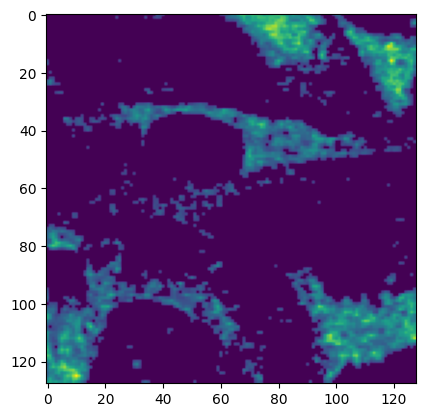

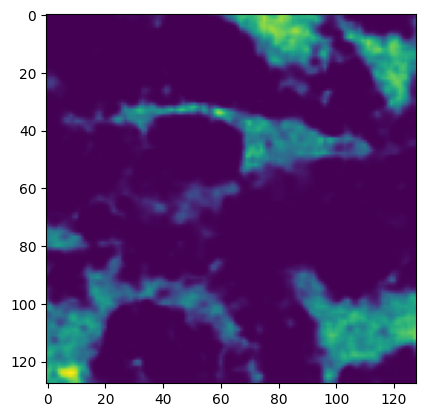

1


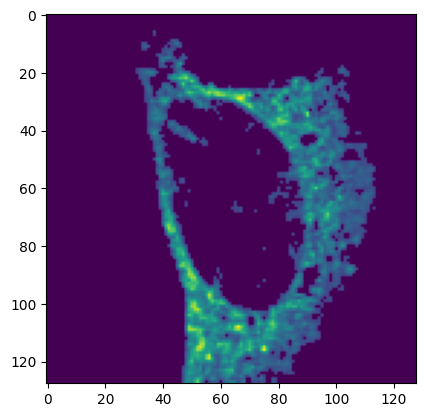

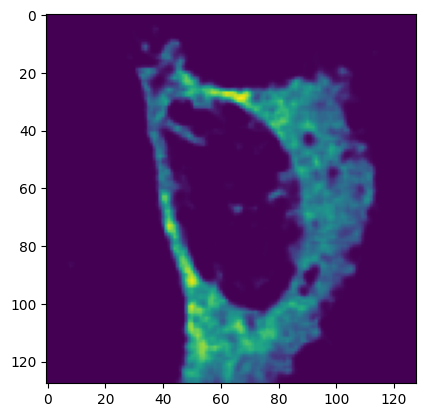

2


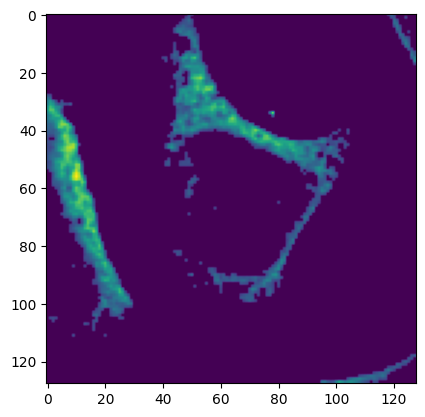

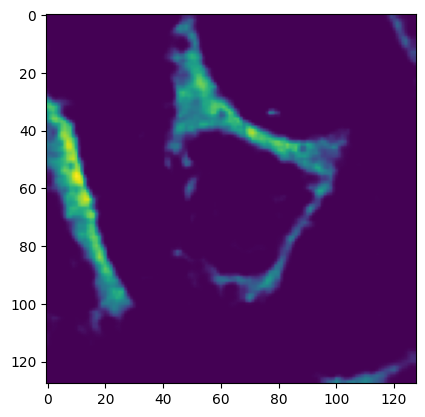

3


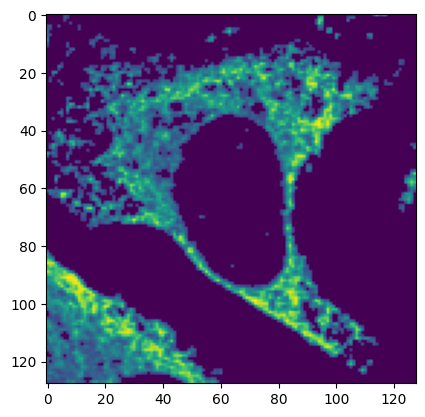

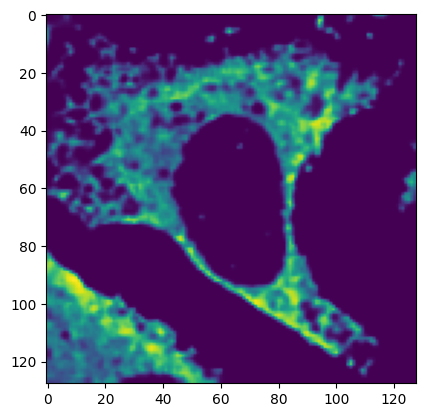

4


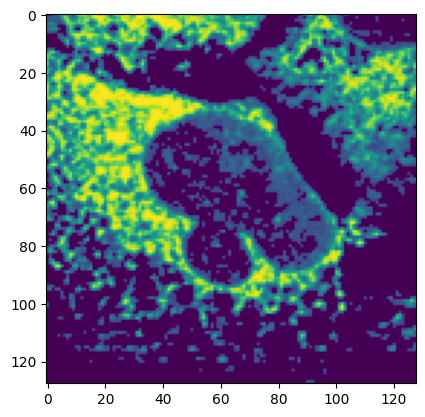

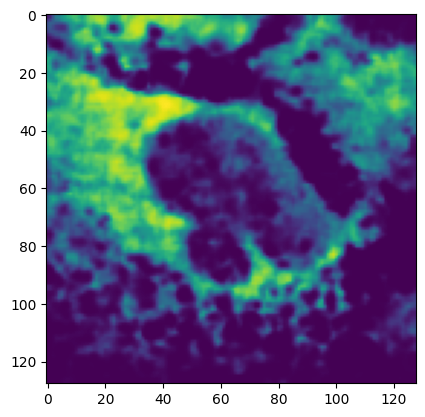

5


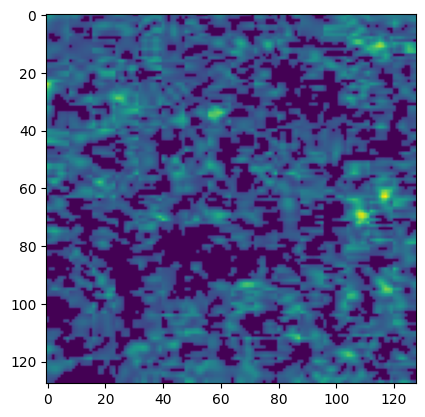

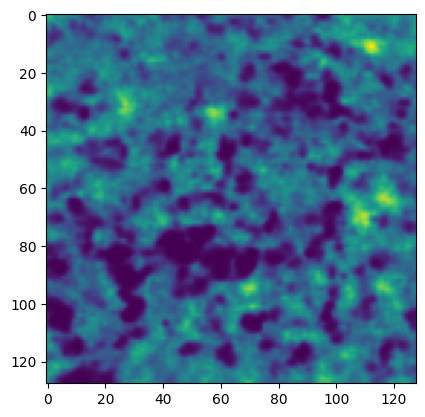

6


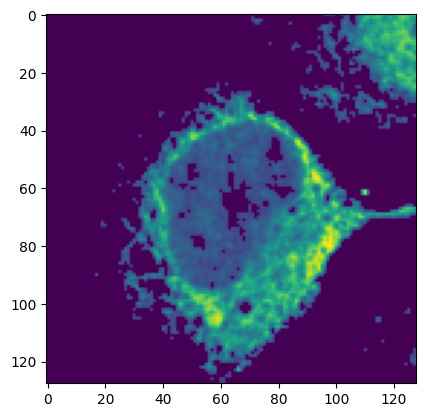

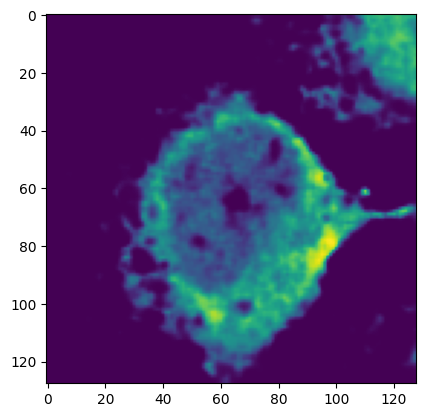

7


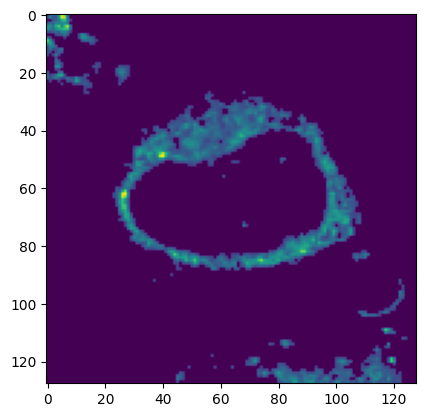

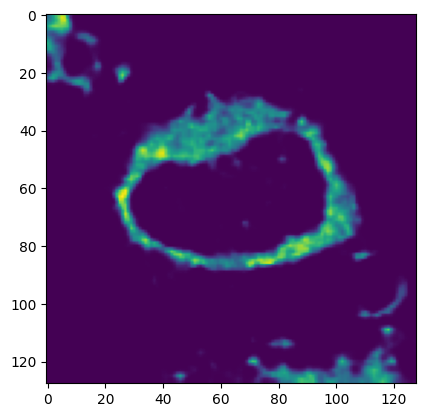

8


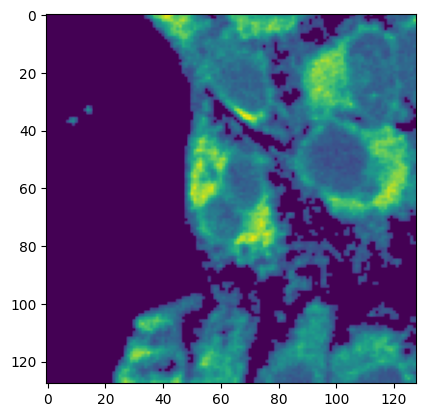

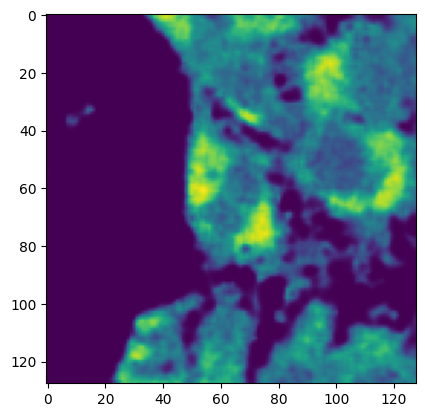

9


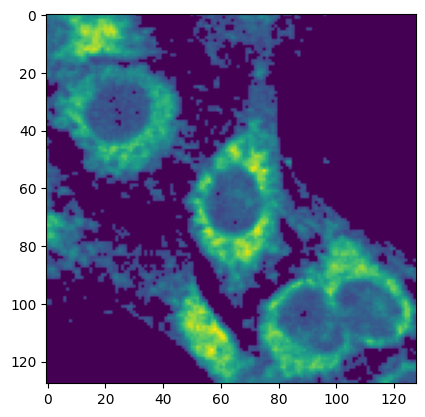

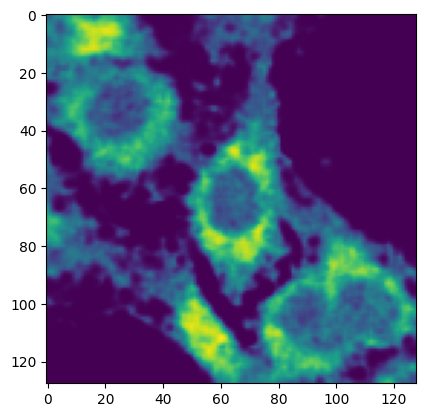

10


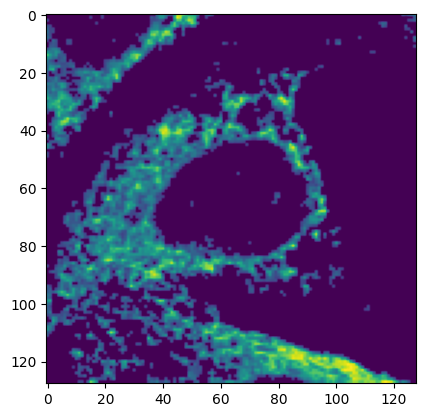

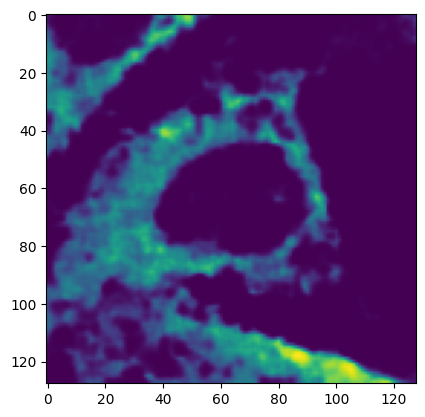

11


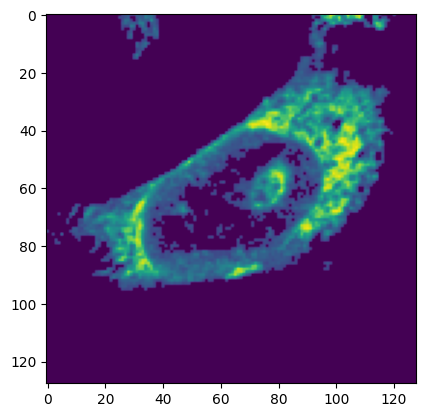

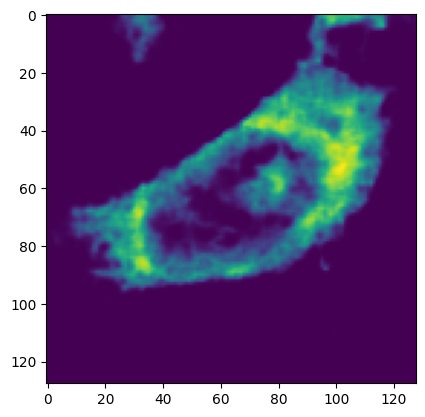

12


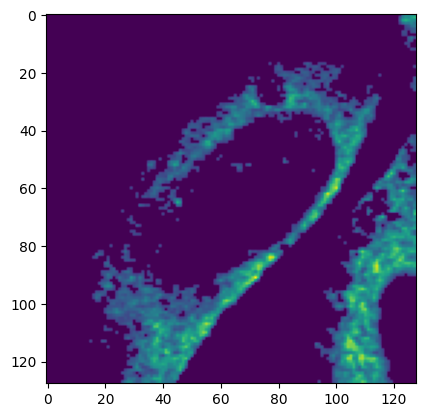

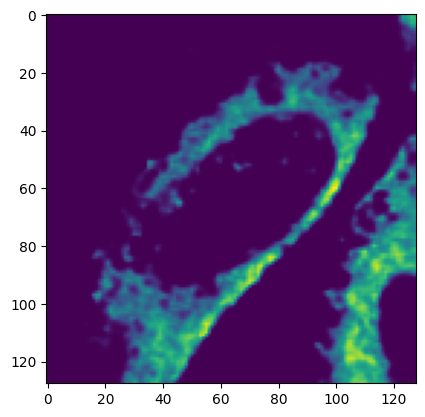

13


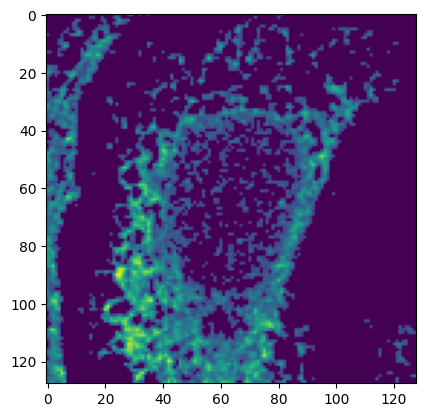

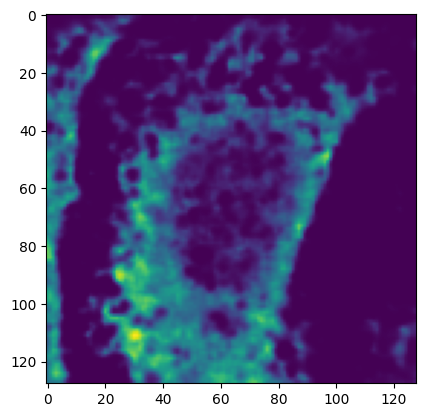

14


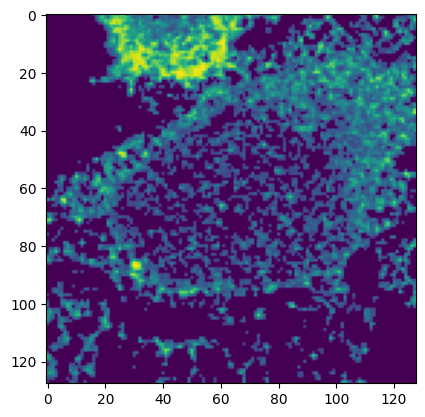

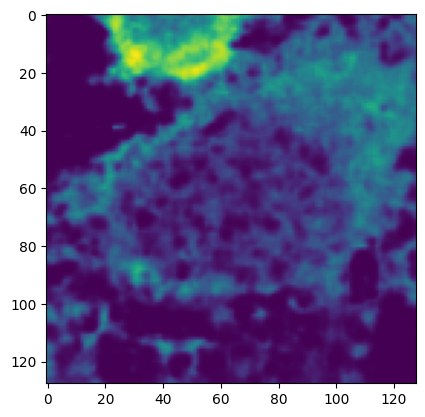

15


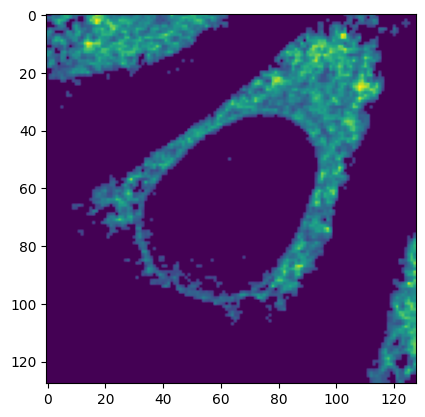

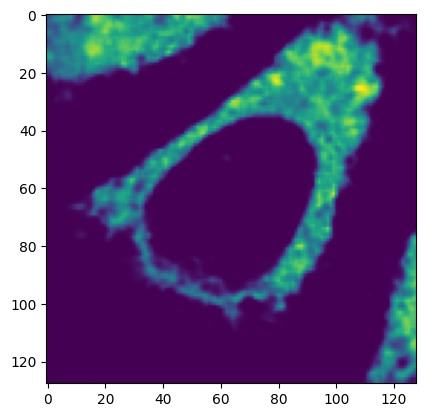

16


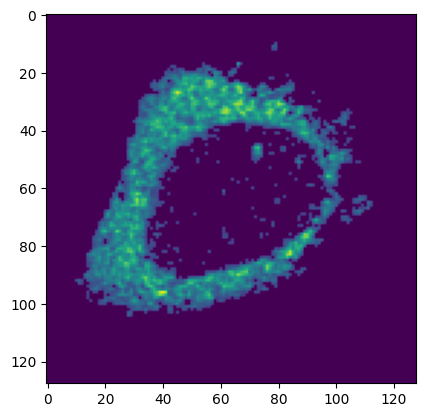

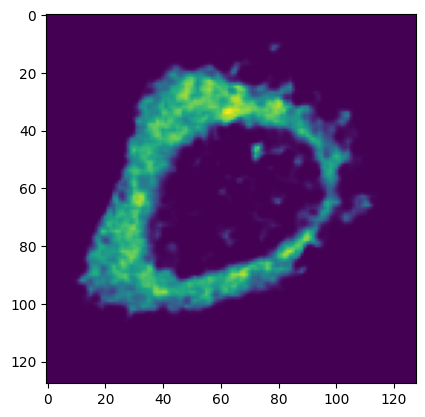

17


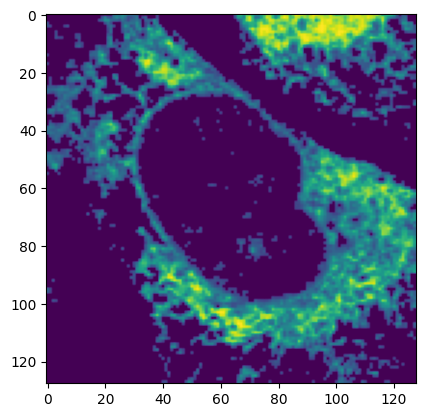

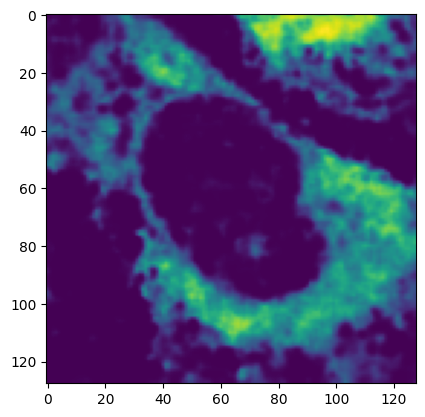

18


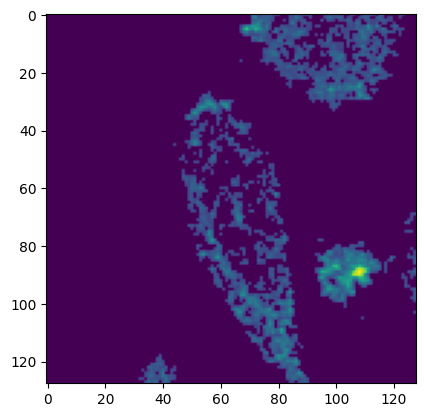

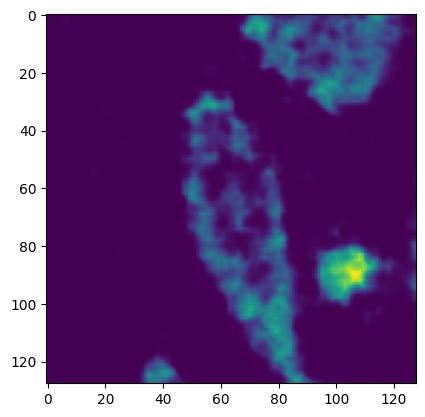

19


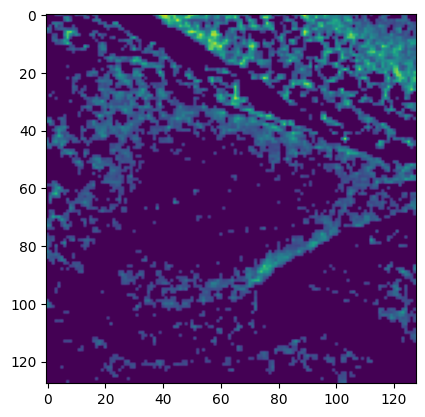

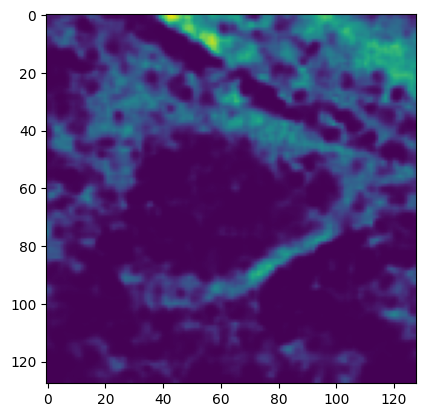

In [28]:
sigmoid=torch.nn.Sigmoid()
for i in range(20):
    print(i)
    plt.imshow(sigmoid(traintarget_protein[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(recon_protein[i][0]).cpu().detach().numpy())
    plt.show()

0


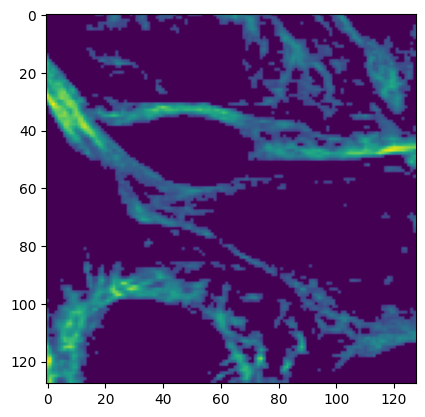

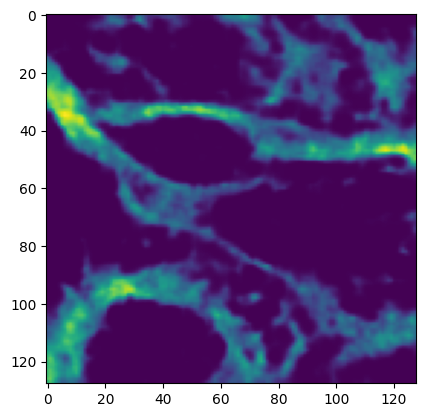

1


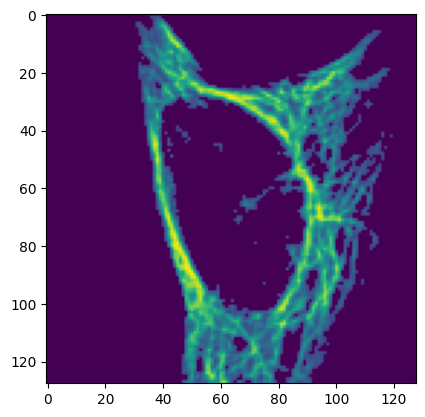

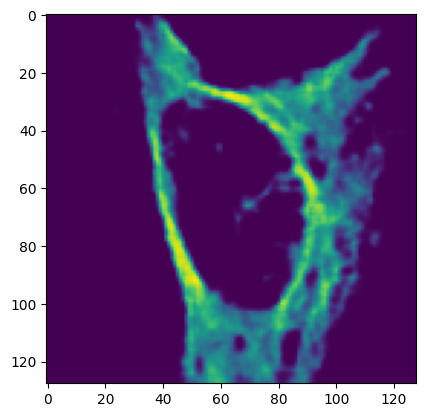

2


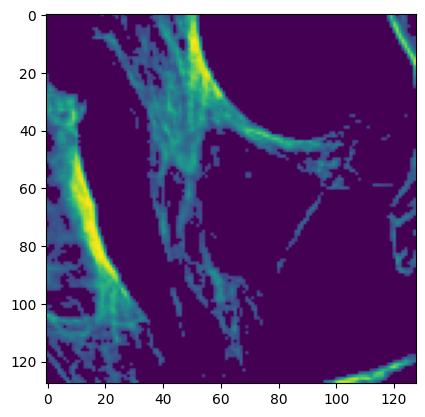

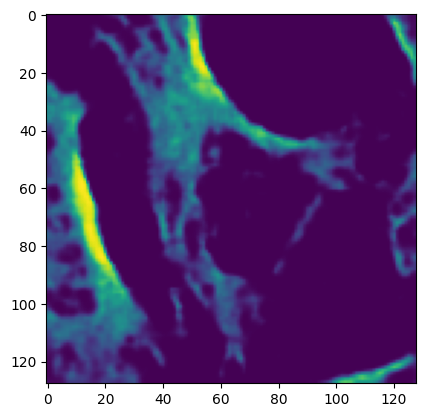

3


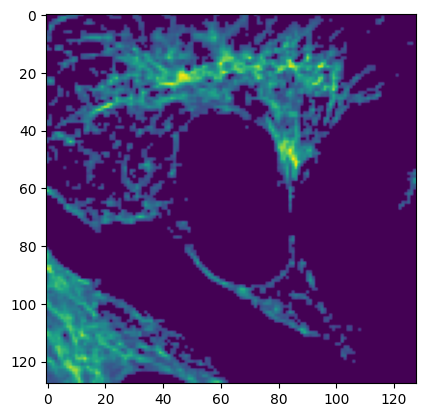

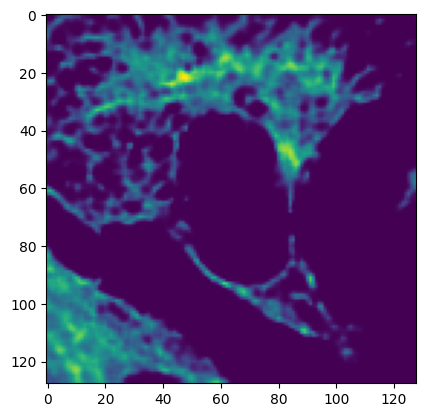

4


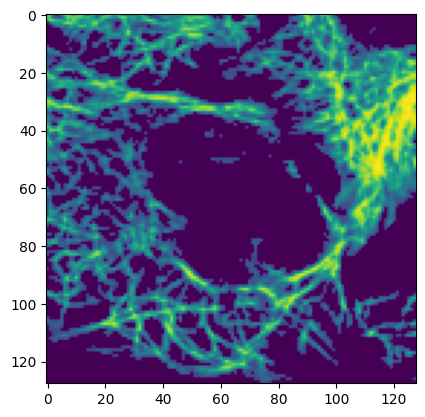

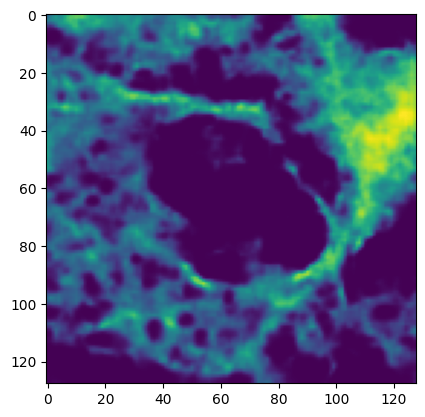

5


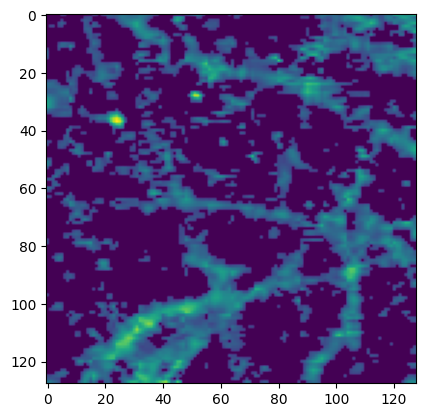

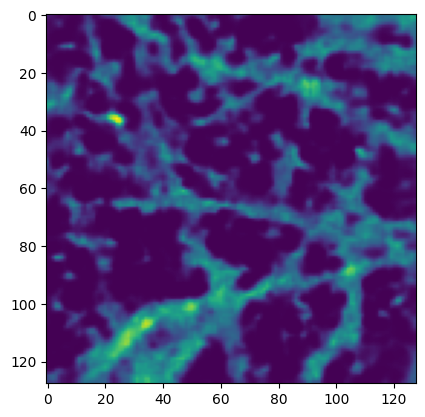

6


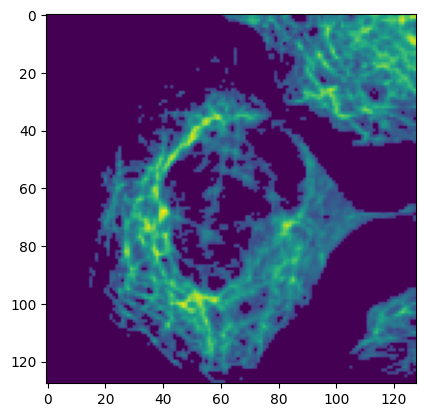

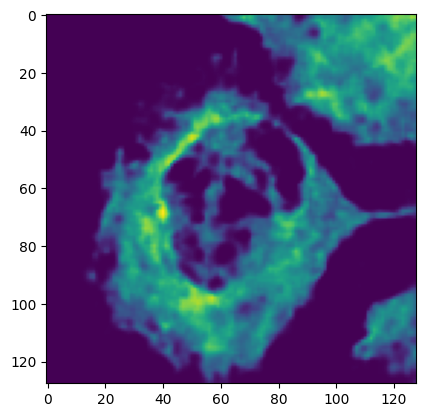

7


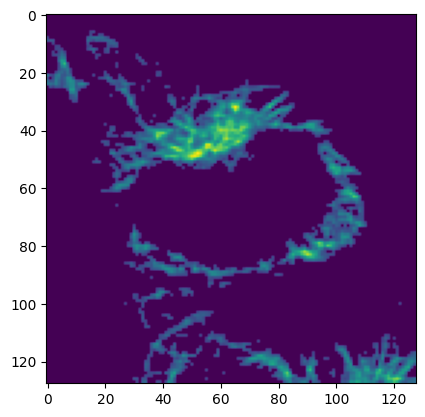

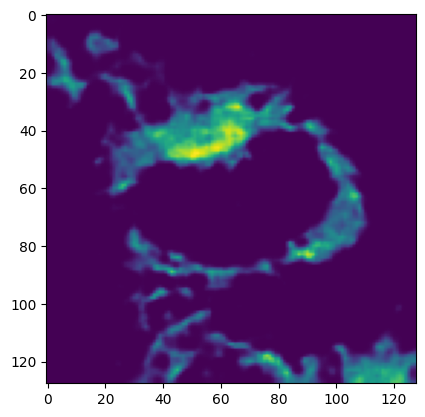

8


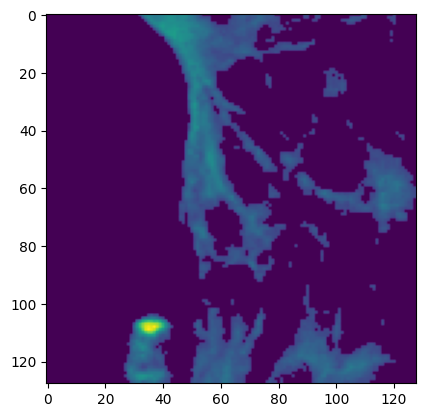

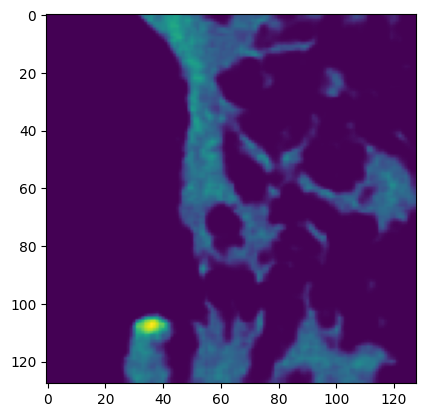

9


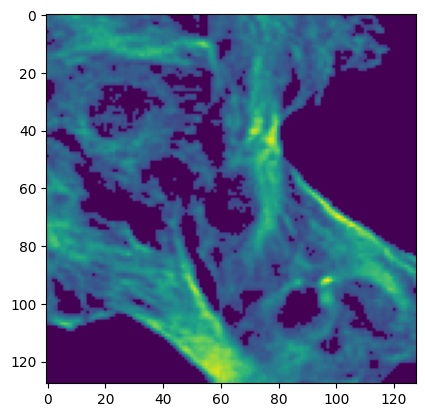

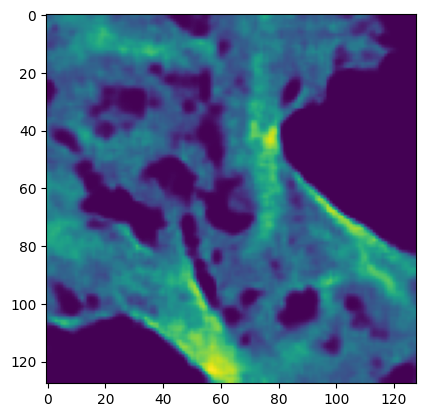

10


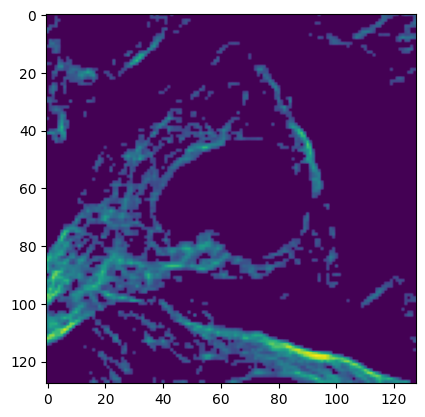

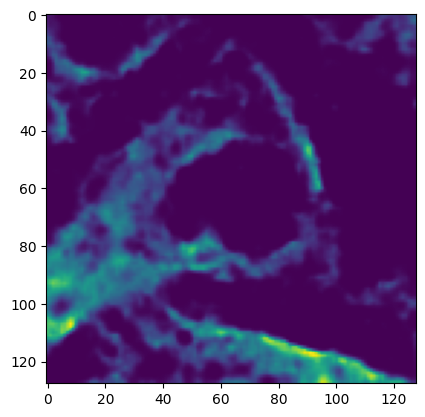

11


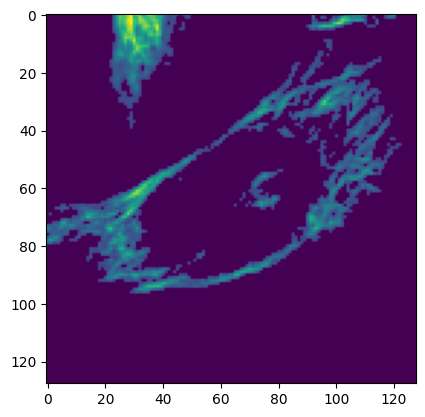

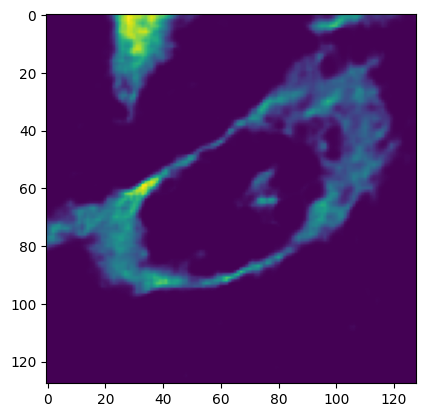

12


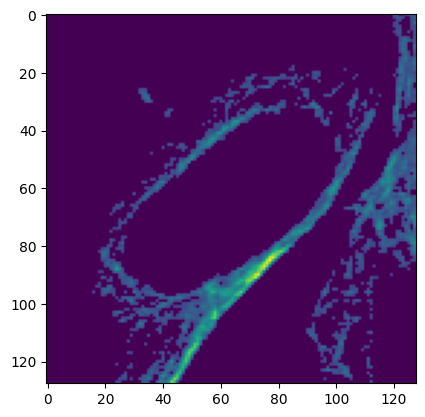

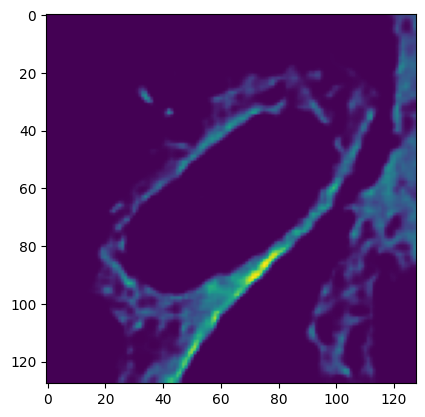

13


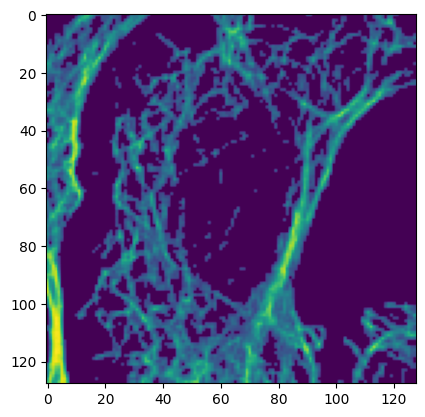

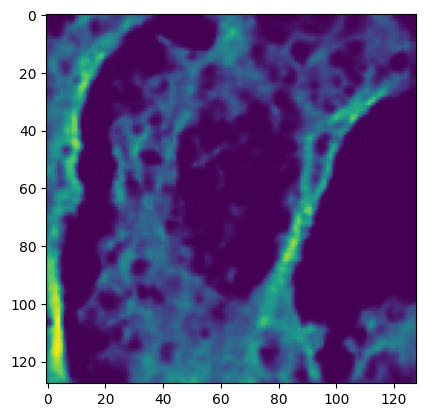

14


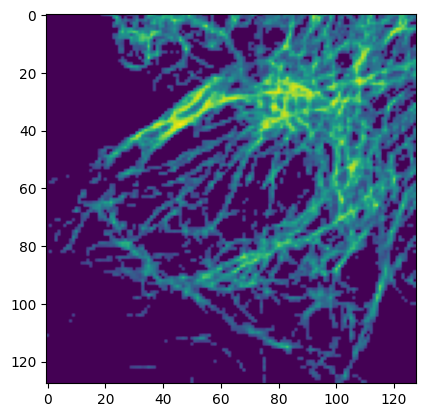

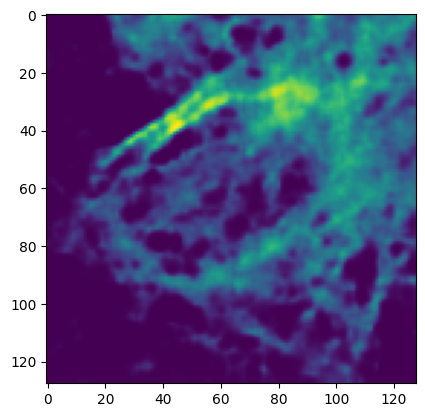

15


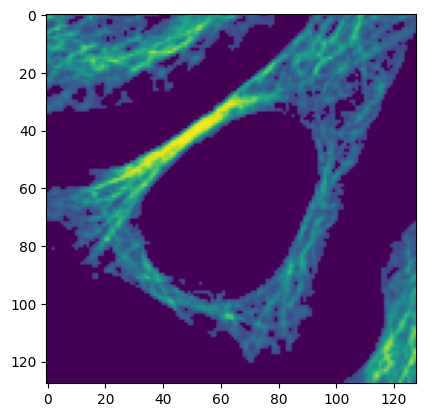

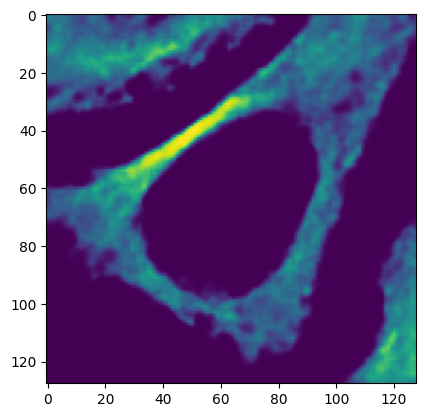

16


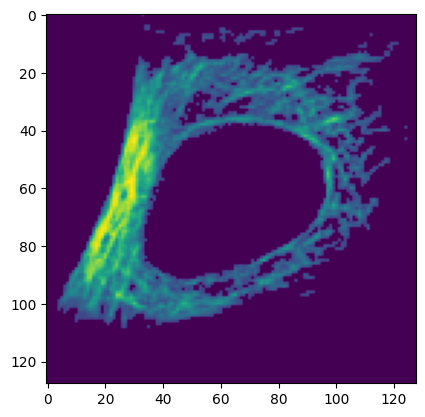

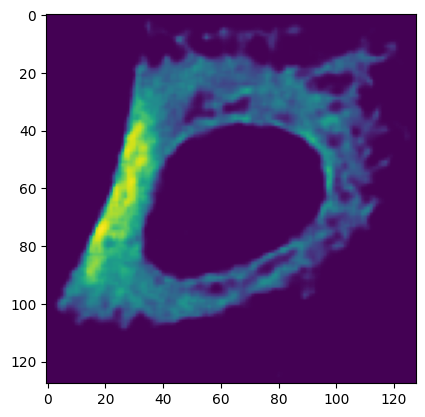

17


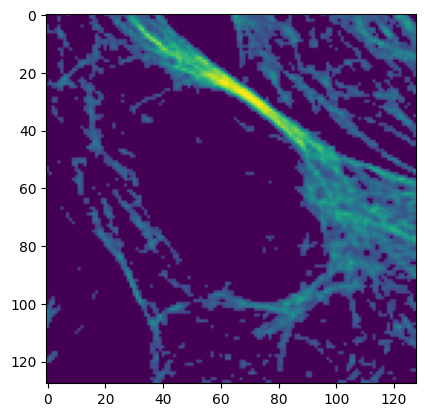

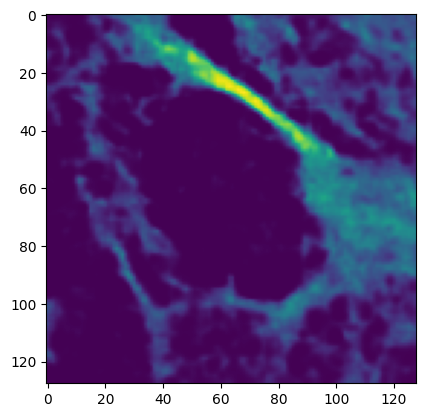

18


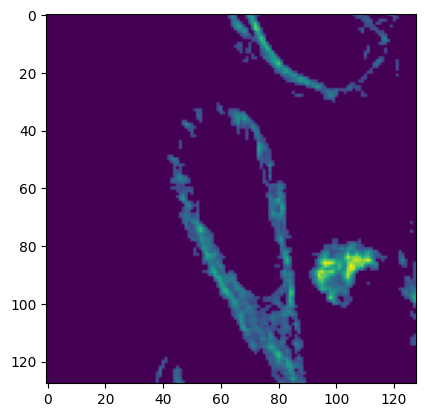

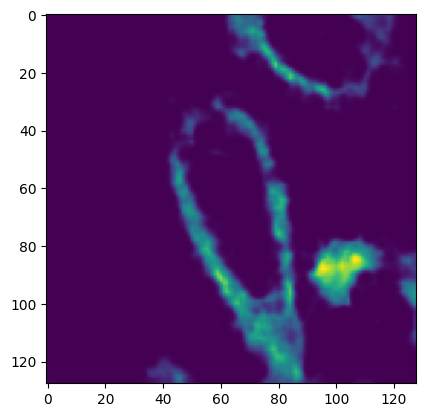

19


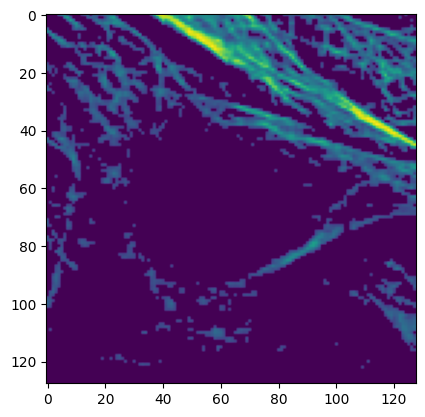

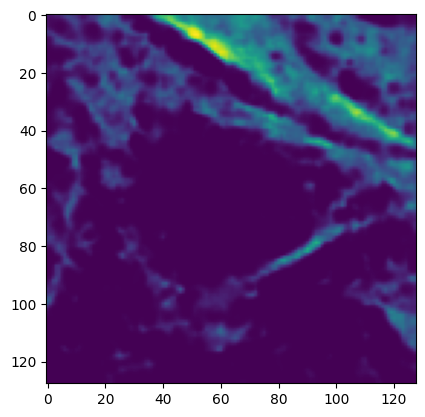

In [29]:
for i in range(20):
    print(i)
    plt.imshow(sigmoid(traintarget_dna[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(recon_dna[i][0]).cpu().detach().numpy())
    plt.show()

In [30]:
with open(os.path.join('/mnt/d2/xinyi/c2p/hpa/plots/',modelname_train,'nucProp_u2os'), 'rb') as output:
    allNucProp=pickle.load(output)
cellIDbyCellLine_pNamesFiltered_comb=np.concatenate((cellIDbyCellLine_pNamesFiltered,cellIDbyCellLine_new_pNamesFiltered))
allNucProp_byProtein=np.zeros(cellIDbyCellLine_pNamesUniqueFiltered.size)
for pidx in range(cellIDbyCellLine_pNamesUniqueFiltered.size):
    p=cellIDbyCellLine_pNamesUniqueFiltered[pidx]
    pidx_cell=cellIDbyCellLine_pNamesFiltered_comb==p
    allNucProp_byProtein[pidx]=np.std(allNucProp[pidx_cell])
allNucProp_stdRank=np.argsort(-allNucProp_byProtein)
allNucProp_stdRank

array([  6,  80,   7, 137, 129,   3, 125,   4,  95,  12,  93,   0,  91,
        47,  73,  11,  32, 119,   5, 128,  76, 108,  96,  65,  20,  37,
        14,  53,  69,  43,  90,  56,  27,  33,  26,  45,  61,  55, 112,
        16,  39, 136,  94,  21,  42,  85, 123,  31,  40,  68, 139,  92,
       105,  41,  22,  36,  19, 140,  84,  52, 103, 102,  78,  58,  83,
       131,  75,  29,  70,  66,  38, 130,  13,  74,  79, 126,  86,  10,
        15, 100,  54, 114, 135, 138,   1,  46, 111,   8,  34,  24,  18,
       132,  28,  81,  87,  49, 104, 127,  62, 120,  97,  98,  77,  72,
        82,  88,  67, 121,  60, 124, 133,  64, 107,  89,  44,  63,   9,
       101, 117,  48,  57,  35,  30,  59, 110,  25, 116, 134,  23,  99,
        17,  51, 122, 109, 118, 106,   2, 113,  50,  71, 115])

ABCB8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

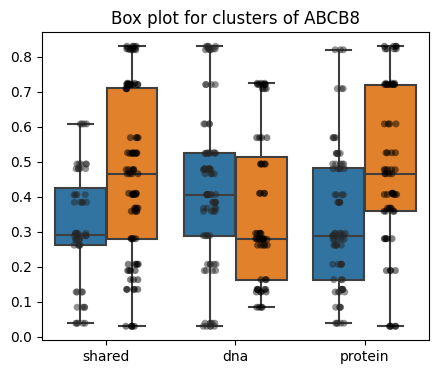

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 8.350250852754145e-05
Two-sided p-value for latent_dna_dec clusters: 0.08199423674127566
Two-sided p-value for latent_protein_dec clusters: 3.105099151412094e-05
CPSF6


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


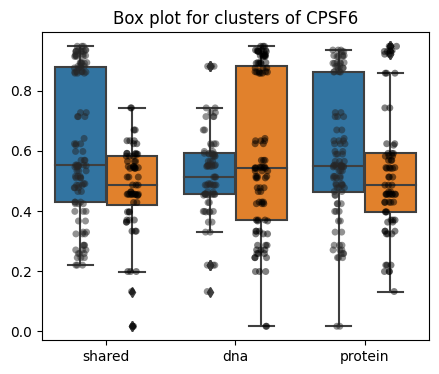

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 3.056558852388087e-05
Two-sided p-value for latent_dna_dec clusters: 0.03952244844395317
Two-sided p-value for latent_protein_dec clusters: 0.04922929602559937
ABCC8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


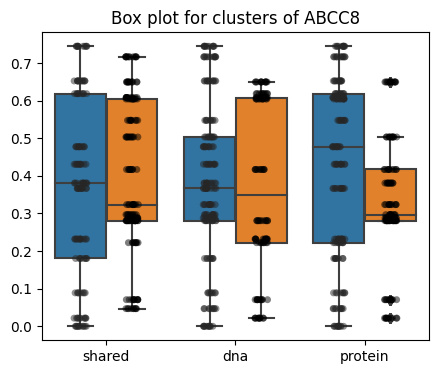

Two-sided p-value for latent_shared_dec clusters: 0.1774499756427789
Two-sided p-value for latent_dna_dec clusters: 0.7069689535596015
Two-sided p-value for latent_protein_dec clusters: 0.0001273878699415331
FTSJ3


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

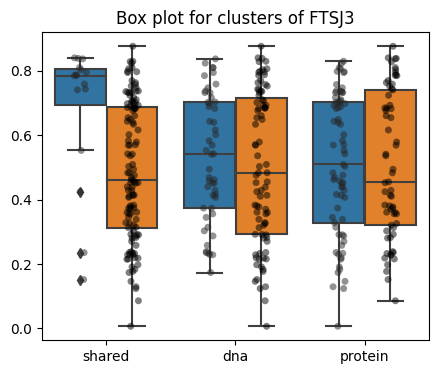

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.0007914916596329167
Two-sided p-value for latent_dna_dec clusters: 0.462742383070046
Two-sided p-value for latent_protein_dec clusters: 0.9567765403175537
FAM131A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


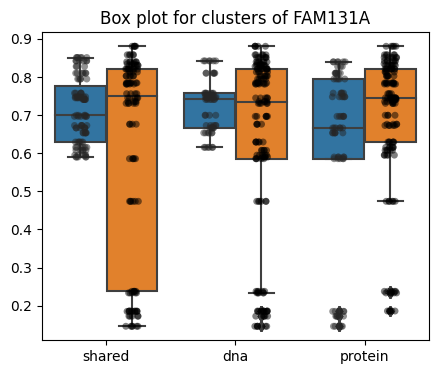

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.0003865211883125229
Two-sided p-value for latent_dna_dec clusters: 0.0018876345739866612
Two-sided p-value for latent_protein_dec clusters: 0.0019743314028525362
AASS


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


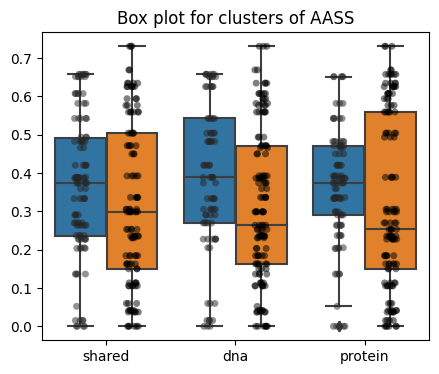

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.04967282312074073
Two-sided p-value for latent_dna_dec clusters: 0.007412004301501586
Two-sided p-value for latent_protein_dec clusters: 0.10383033378118586
ETFA


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


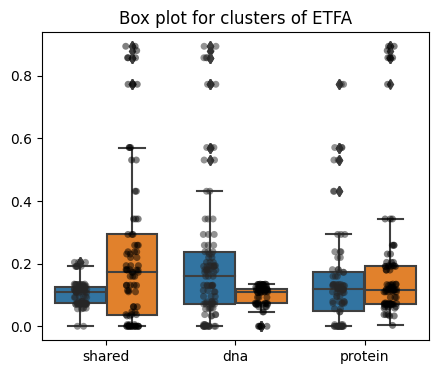

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 1.1709341197737077e-05
Two-sided p-value for latent_dna_dec clusters: 0.00010113461774299009
Two-sided p-value for latent_protein_dec clusters: 0.21631540261409637
ABAT


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


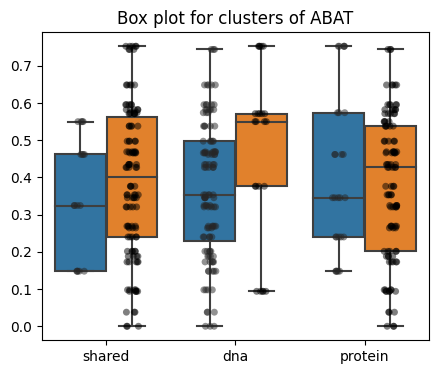

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.5430638868985904
Two-sided p-value for latent_dna_dec clusters: 0.021249432249885007
Two-sided p-value for latent_protein_dec clusters: 0.5014064469472341
DDX21


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


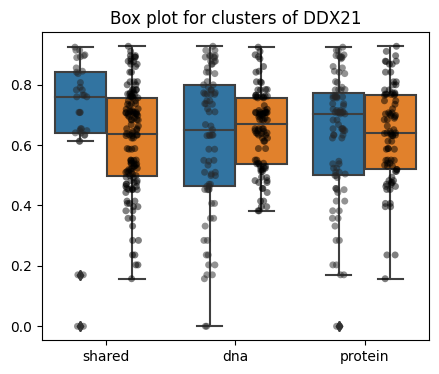

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.05071740097378808
Two-sided p-value for latent_dna_dec clusters: 0.17454626439357782
Two-sided p-value for latent_protein_dec clusters: 0.9005129429427922
ADCY5


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


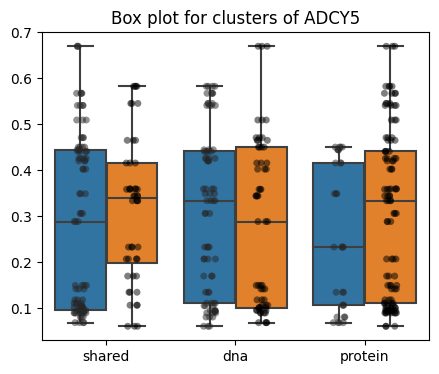

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.33060229654273143
Two-sided p-value for latent_dna_dec clusters: 0.4487852892258579
Two-sided p-value for latent_protein_dec clusters: 0.17780775414133465
DDX1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


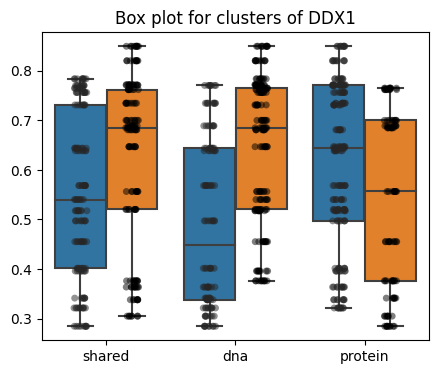

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.0006552581937987658
Two-sided p-value for latent_dna_dec clusters: 3.3423532558888534e-16
Two-sided p-value for latent_protein_dec clusters: 0.0005730982146395678
A1CF


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


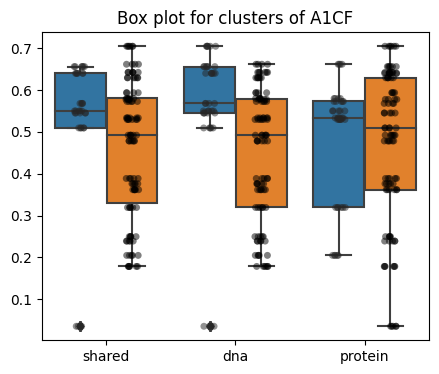

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.18030179117766754
Two-sided p-value for latent_dna_dec clusters: 0.005297270391853471
Two-sided p-value for latent_protein_dec clusters: 0.6097084542089557
DDB1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


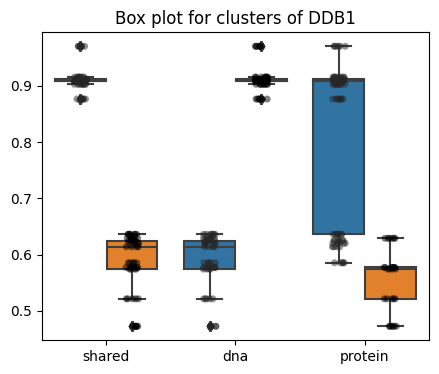

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 9.362914818586676e-79
Two-sided p-value for latent_dna_dec clusters: 9.362914818586676e-79
Two-sided p-value for latent_protein_dec clusters: 2.3300731554375693e-18
C8orf59


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


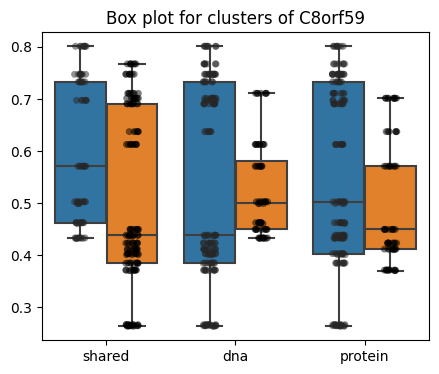

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 1.9201233197394213e-05
Two-sided p-value for latent_dna_dec clusters: 0.5751963585390036
Two-sided p-value for latent_protein_dec clusters: 0.03620302283843309
CIZ1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


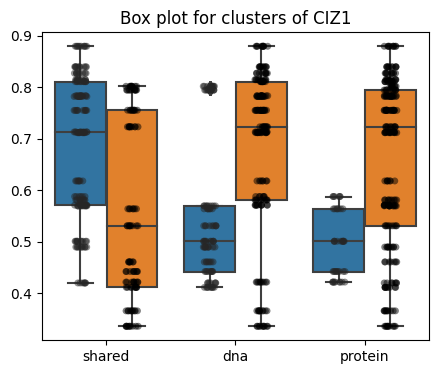

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 5.043621274937459e-12
Two-sided p-value for latent_dna_dec clusters: 5.789336329921701e-11
Two-sided p-value for latent_protein_dec clusters: 7.930334870464149e-10
ADAR


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


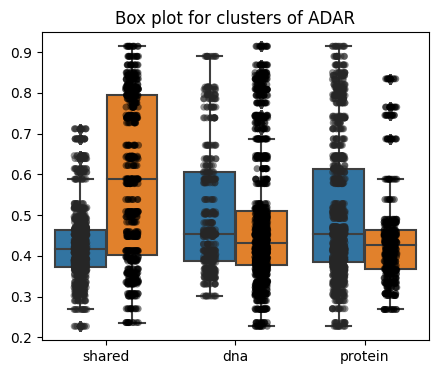

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 3.4555675448469544e-116
Two-sided p-value for latent_dna_dec clusters: 0.0007021491432264567
Two-sided p-value for latent_protein_dec clusters: 8.446146698874271e-15
ATE1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


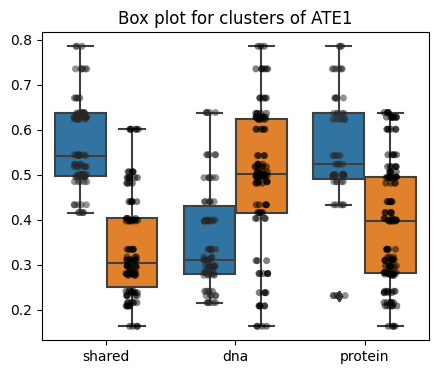

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 3.0367800013590977e-37
Two-sided p-value for latent_dna_dec clusters: 1.8004795081838666e-11
Two-sided p-value for latent_protein_dec clusters: 4.349870706710313e-12
ELAC2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


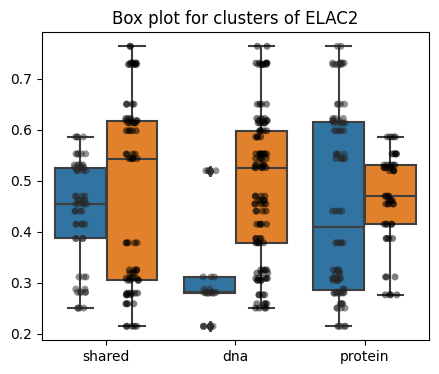

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.21643888023753152
Two-sided p-value for latent_dna_dec clusters: 5.190126142103314e-08
Two-sided p-value for latent_protein_dec clusters: 0.7496212612019404
ABCB7


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


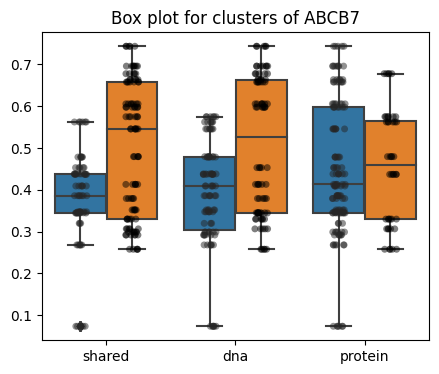

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 4.41894391019941e-08
Two-sided p-value for latent_dna_dec clusters: 6.636685574056003e-07
Two-sided p-value for latent_protein_dec clusters: 0.735079520650904
FAM111A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


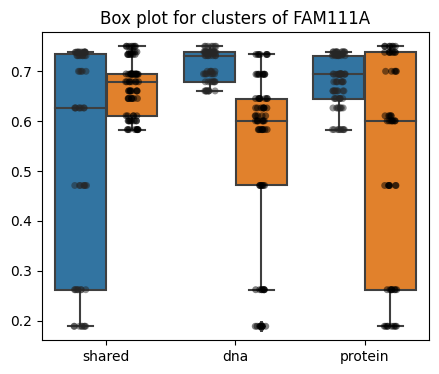

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 2.6415059428534554e-06
Two-sided p-value for latent_dna_dec clusters: 1.092547333229879e-12
Two-sided p-value for latent_protein_dec clusters: 1.0112561454782897e-09
CLNS1A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


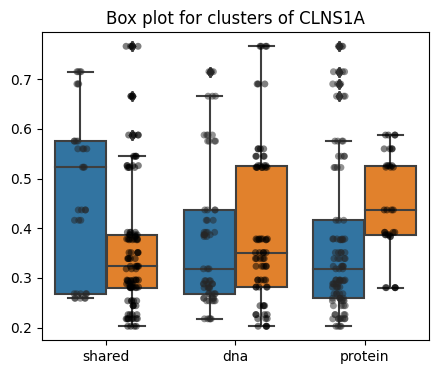

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.00011344456975306094
Two-sided p-value for latent_dna_dec clusters: 0.4750041626718906
Two-sided p-value for latent_protein_dec clusters: 0.010349768855985096
EARS2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


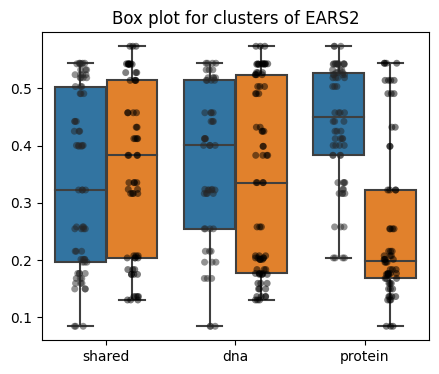

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.6218227636412346
Two-sided p-value for latent_dna_dec clusters: 0.2763462644322076
Two-sided p-value for latent_protein_dec clusters: 2.080957002270306e-14
DDX39B


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


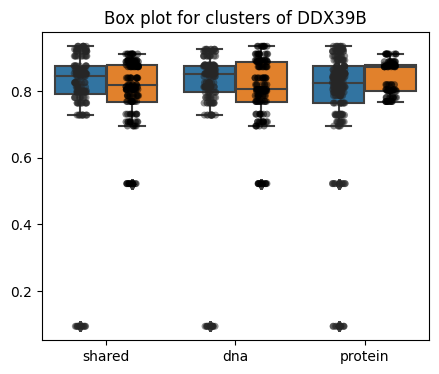

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.4099061607513309
Two-sided p-value for latent_dna_dec clusters: 0.687826297375772
Two-sided p-value for latent_protein_dec clusters: 0.0007149478799602255
CHAMP1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


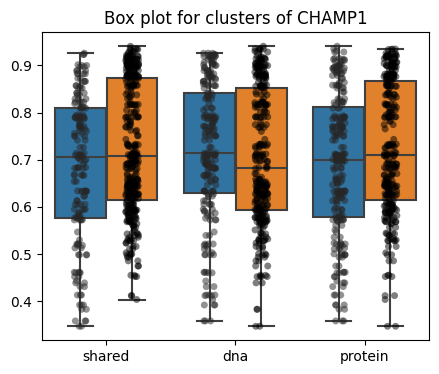

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.0013316722085696328
Two-sided p-value for latent_dna_dec clusters: 0.3955237530999842
Two-sided p-value for latent_protein_dec clusters: 0.0051825897192357695
ALG2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


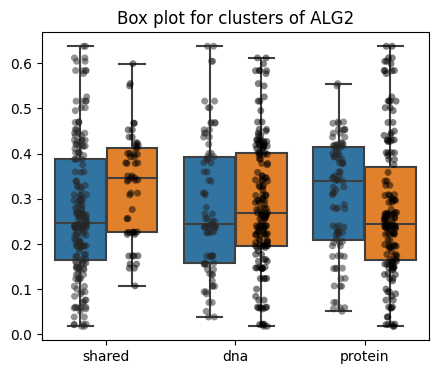

Two-sided p-value for latent_shared_dec clusters: 0.008529391258630347
Two-sided p-value for latent_dna_dec clusters: 0.7206202448943158
Two-sided p-value for latent_protein_dec clusters: 0.08168104602036447


In [197]:
from sklearn.cluster import KMeans
from scipy.stats import ttest_ind

for pidx in range(25):
    p = cellIDbyCellLine_pNamesUniqueFiltered[allNucProp_stdRank[pidx]]
    print(p)

    # Prepare data for latent_shared_dec
    latent_shared = latent_shared_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_shared = KMeans(n_clusters=2, random_state=0).fit(latent_shared)
    labels_shared = kmeans_shared.labels_
    data_shared = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]

    # Prepare data for latent_dna_dec
    latent_dna = latent_dna_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_dna = KMeans(n_clusters=2, random_state=0).fit(latent_dna)
    labels_dna = kmeans_dna.labels_
    data_dna = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]

    # Prepare data for latent_protein_dec
    latent_protein = latent_protein_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_protein = KMeans(n_clusters=2, random_state=0).fit(latent_protein)
    labels_protein = kmeans_protein.labels_
    data_protein = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]

    # Combine data
    data_combined = np.concatenate([data_shared, data_dna, data_protein])
    labels_combined = np.concatenate([labels_shared, labels_dna, labels_protein])
    latent_names = np.array(['shared'] * len(data_shared) + ['dna'] * len(data_dna) + ['protein'] * len(data_protein))

    # Box plot with data points
    plt.figure(figsize=(5, 4))
    sns.boxplot(x=latent_names, y=data_combined, hue=labels_combined)
    sns.stripplot(x=latent_names, y=data_combined, hue=labels_combined, dodge=True, jitter=True, color='black', alpha=0.5)
    plt.title(f'Box plot for clusters of {p}')
    plt.legend([],[], frameon=False) # Remove legend created by stripplot
    plt.show()

    # Compute two-sided p-value
    group1_shared = data_shared[labels_shared == 0]
    group2_shared = data_shared[labels_shared == 1]
    t_stat_shared, p_val_shared = ttest_ind(group1_shared, group2_shared)
    print(f"Two-sided p-value for latent_shared_dec clusters: {p_val_shared}")

    group1_dna = data_dna[labels_dna == 0]
    group2_dna = data_dna[labels_dna == 1]
    t_stat_dna, p_val_dna = ttest_ind(group1_dna, group2_dna)
    print(f"Two-sided p-value for latent_dna_dec clusters: {p_val_dna}")

    group1_protein = data_protein[labels_protein == 0]
    group2_protein = data_protein[labels_protein == 1]
    t_stat_protein, p_val_protein = ttest_ind(group1_protein, group2_protein)
    print(f"Two-sided p-value for latent_protein_dec clusters: {p_val_protein}")

In [92]:
exampleSavePath=os.path.join(plotsavepath_train,'nucProp_clusterExamples_withProtein')
nExamples=20
imgSize=128
for pidx in range(25):
    p = cellIDbyCellLine_pNamesUniqueFiltered[allNucProp_stdRank[pidx]]
    print(p)
    
    # Prepare data for latent_shared_dec
    latent_shared = latent_shared_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_shared = KMeans(n_clusters=2, random_state=0).fit(latent_shared)
    labels_shared = kmeans_shared.labels_
    data_shared = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_shared==0]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],1]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_shared_0.jpg'),plotExample)
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_shared==1]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],1]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_shared_1.jpg'),plotExample)

    # Prepare data for latent_dna_dec
    latent_dna = latent_dna_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_dna = KMeans(n_clusters=2, random_state=0).fit(latent_dna)
    labels_dna = kmeans_dna.labels_
    data_dna = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_dna==0]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],1]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_dna_0.jpg'),plotExample)
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_dna==1]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],1]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_dna_1.jpg'),plotExample)

    # Prepare data for latent_protein_dec
    latent_protein = latent_protein_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_protein = KMeans(n_clusters=2, random_state=0).fit(latent_protein)
    labels_protein = kmeans_protein.labels_
    data_protein = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_protein==0]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],1]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_protein_0.jpg'),plotExample)
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_protein==1]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],1]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_protein_1.jpg'),plotExample)



ABCB8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
CPSF6


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ABCC8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
FTSJ3


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
FAM131A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
AASS


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ETFA


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ABAT


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
DDX21


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ADCY5


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
sampled
sampled
DDX1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
A1CF


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
DDB1
sampled
sampled
sampled
sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

sampled
C8orf59
sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
CIZ1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ADAR


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ATE1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ELAC2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ABCB7


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
FAM111A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
CLNS1A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
EARS2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
DDX39B


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
CHAMP1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ALG2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


In [203]:
from sklearn.cluster import KMeans
from scipy.stats import ttest_ind

# Define the number of clusters and random states
n_runs = 5
nsig=4
num_latents = 3
num_proteins = 25
abs_diff_means = np.zeros((num_proteins, num_latents))
significant_entries = np.zeros((num_proteins, num_latents), dtype=int)
diff_thresh=0.1

bonferroni_threshold = 0.05 / (num_proteins * num_latents)/3

for pidx in range(25):
    p = cellIDbyCellLine_pNamesUniqueFiltered[allNucProp_stdRank[pidx]]
    print(p)

    # Prepare data for each latent
    latent_data = {
        'shared': latent_shared_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy(),
        'dna': latent_dna_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy(),
        'protein': latent_protein_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    }

    for latent_name, latent in latent_data.items():
        all_abs_diff_means = []
        all_significant_entries = []

        for run in range(n_runs):
            kmeans = KMeans(n_clusters=2, random_state=run).fit(latent)
            labels = kmeans.labels_
            data = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]

            group1 = data[labels == 0]
            group2 = data[labels == 1]
            abs_diff_mean = np.abs(np.mean(group1) - np.mean(group2))
            all_abs_diff_means.append(abs_diff_mean)

            _, p_val = ttest_ind(group1, group2)
            significant = p_val < bonferroni_threshold
            all_significant_entries.append(significant)

        # Average the absolute differences
        avg_abs_diff_means = np.mean(all_abs_diff_means)
        abs_diff_means[pidx, {'shared': 0, 'dna': 1, 'protein': 2}[latent_name]] = avg_abs_diff_means

        # Determine if there was any significant result across all runs
        sigDiff=np.array(all_abs_diff_means)>diff_thresh
        significant_entries[pidx, {'shared': 0, 'dna': 1, 'protein': 2}[latent_name]] = np.sum(np.logical_and(all_significant_entries,sigDiff))


ABCB8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

CPSF6


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ABCC8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

FTSJ3


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

FAM131A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

AASS


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ETFA


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ABAT


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

DDX21


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ADCY5


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

DDX1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

A1CF


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

DDB1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

C8orf59


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

CIZ1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ADAR


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ATE1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ELAC2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ABCB7


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

FAM111A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

CLNS1A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

EARS2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

DDX39B


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

CHAMP1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

ALG2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicit

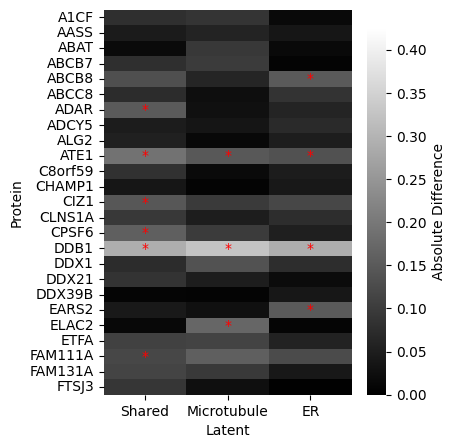

In [205]:
filtered_significant_entries = significant_entries>nsig
filtered_proteins = [cellIDbyCellLine_pNamesUniqueFiltered[allNucProp_stdRank[i]] for i in range(25)]

filtered_proteins_array = np.array(filtered_proteins)

# Sort abs_diff_means and filtered_proteins by protein names (row names) alphabetically
sorted_indices = np.argsort(filtered_proteins_array)
abs_diff_means = abs_diff_means[sorted_indices, :]
filtered_proteins_sorted = filtered_proteins_array[sorted_indices]
filtered_significant_entries = filtered_significant_entries[sorted_indices, :]

# Plotting the heatmap
plt.figure(figsize=(4, 5))
sns.heatmap(abs_diff_means, cmap='gray', cbar_kws={'label': 'Absolute Difference', 'extend': 'max'}, vmin=0, vmax=0.425)

# Adding red asterisks for significant entries
for i in range(abs_diff_means.shape[0]):
    for j in range(abs_diff_means.shape[1]):
        if filtered_significant_entries[i, j]:
            plt.text(j + 0.5, i + 0.5, '*', color='red', ha='center', va='center')

# Labeling axes
plt.xlabel('Latent')
plt.ylabel('Protein')

# Customize x-ticks and y-ticks
plt.xticks(ticks=np.arange(abs_diff_means.shape[1]) + 0.5, labels=['Shared', 'Microtubule','ER'])
plt.yticks(ticks=np.arange(abs_diff_means.shape[0]) + 0.5, labels=filtered_proteins_sorted, rotation=0)

# Save the figure with tight bounding box
plt.savefig(os.path.join(plotsavepath_train, 'nucProp_clusterDiff_top25_filtered_5runs_allprots_ordered.pdf'), bbox_inches='tight')

# Show the plot
plt.show()

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


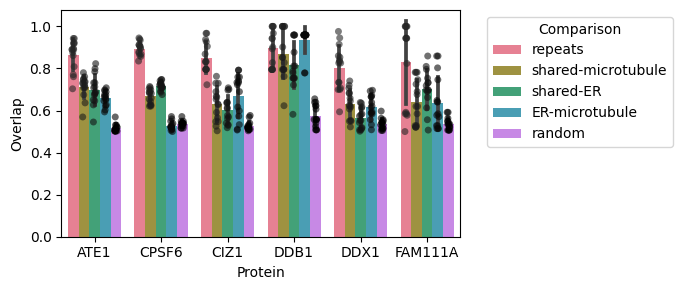

In [151]:
# Define the number of clusters and random states
n_runs = 15
num_proteins = 25
p2plot=['ATE1','CPSF6','CIZ1','DDB1','DDX1','FAM111A']
overlapRes={}

bonferroni_threshold = 0.05 / (num_proteins * num_latents)/2

compnames=['repeats','shared-microtubule','shared-ER','ER-microtubule','random']
for pidx in range(len(p2plot)):
    p = p2plot[pidx]
    print(p)
    
    # Prepare data for each latent
    latent_shared=latent_shared_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    latent_dna=latent_dna_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    latent_protein=latent_protein_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()

    overlapRes[p]=np.zeros((n_runs,5))
    kmeans = KMeans(n_clusters=2, random_state=100).fit(latent_shared)
    labels_shared_0 = kmeans.labels_
    for run in range(n_runs):
        kmeans = KMeans(n_clusters=2, random_state=run).fit(latent_shared)
        labels_shared = kmeans.labels_
        
        kmeans = KMeans(n_clusters=2, random_state=run).fit(latent_dna)
        labels_dna = kmeans.labels_
        
        kmeans = KMeans(n_clusters=2, random_state=run).fit(latent_protein)
        labels_protein = kmeans.labels_
        
        overlapRes[p][run,0]=max(np.sum(labels_shared_0==labels_shared),np.sum(labels_shared_0!=labels_shared))/labels_shared.size
        overlapRes[p][run,1]=max(np.sum(labels_dna==labels_shared),np.sum(labels_dna!=labels_shared))/labels_shared.size
        overlapRes[p][run,2]=max(np.sum(labels_protein==labels_shared),np.sum(labels_protein!=labels_shared))/labels_shared.size
        overlapRes[p][run,3]=max(np.sum(labels_dna==labels_protein),np.sum(labels_dna!=labels_protein))/labels_shared.size
        np.random.seed(run)
        labels_shared_random=np.copy(labels_shared)
        labels_shared_random1=np.copy(labels_shared)
        np.random.shuffle(labels_shared_random)
        np.random.seed(run+1)
        np.random.shuffle(labels_shared_random1)
        overlapRes[p][run,4]=max(np.sum(labels_shared_random==labels_shared_random1),np.sum(labels_shared_random!=labels_shared_random1))/labels_shared.size


results = []
for p in p2plot:
    for run in range(n_runs):
        for i, compname in enumerate(compnames):
            results.append({
                'Protein': p,
                'Comparison': compname,
                'Overlap': overlapRes[p][run, i]
            })

# Convert the list of results into a DataFrame
df = pd.DataFrame(results)

# Plot the data
plt.figure(figsize=(7, 3))
sns.barplot(x='Protein', y='Overlap', hue='Comparison', data=df, errorbar='sd', palette='husl', dodge=True)

# Overlay individual data points
sns.stripplot(x='Protein', y='Overlap', hue='Comparison', data=df, legend=False,
              jitter=True, dodge=True, marker='o', color='black', alpha=0.6)

# Adjusting the plot
plt.ylabel('Overlap')
plt.legend(title='Comparison', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()        



/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


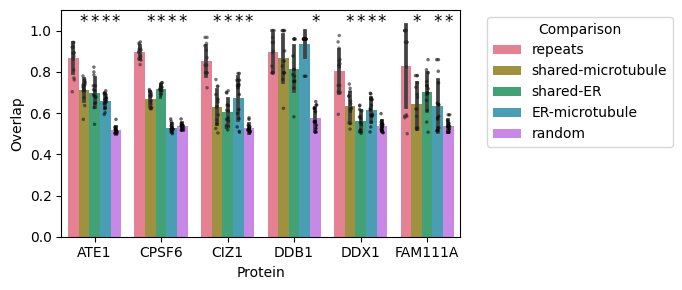

In [196]:
# Set the bar plot with error bars
plt.figure(figsize=(7, 3))
barplot = sns.barplot(x='Protein', y='Overlap', hue='Comparison', data=df, errorbar='sd', palette='husl', dodge=True)

# Overlay individual data points without legend
sns.stripplot(x='Protein', y='Overlap', hue='Comparison', data=df, 
              jitter=True, dodge=True, marker='.', color='black', alpha=0.6, legend=False)

# Calculate and annotate asterisks for significant p-values separately for each protein
for p in p2plot:
    df_p = df[df['Protein'] == p]
    y_max = df_p['Overlap'].max()
    
    # Get the positions of the bars
    bars = barplot.patches
    
    # Iterate over comparisons except "repeats"
    for comp_idx, comp in enumerate(compnames[1:], start=1):
        
        group1 = df_p[df_p['Comparison'] == 'repeats']['Overlap']
        group2 = df_p[df_p['Comparison'] == comp]['Overlap']

        # Perform t-test
        t_stat, p_val = ttest_ind(group1, group2)

        # Bonferroni correction for multiple comparisons
        p_val_corrected = min(p_val * (len(compnames) - 1), 1.0)

        # Determine if the p-value is significant
        if p_val_corrected < 0.05:
            # Calculate x-position and y-position for the asterisk
            x_pos = bars[p2plot.index(p)+comp_idx*6].get_x() + bars[p2plot.index(p)+comp_idx*6].get_width() / 2
            y_pos = bars[comp_idx].get_height() + 0.4

#             print(comp_idx, comp, x_pos, y_max)
            # Annotate with an asterisk above the bar
            plt.text(x_pos, 1, '*', ha='center', va='bottom', color='k', fontsize=12)

# Adjusting the plot
plt.ylim(0, df['Overlap'].max() + 0.1)  # Increase the y-limit to make space for asterisks
plt.ylabel('Overlap')
# plt.title('Overlap Across Latent Spaces for Selected Proteins')
plt.legend(title='Comparison', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.savefig(os.path.join(plotsavepath_train,'nucProp_clusterOverlap.pdf'), bbox_inches='tight')

# Show the plot
plt.show()
